# Faster R-CNN: A Classic Two-Stage Anchor-Based Object Detector

In this exercise you will implement a **two-stage** object detector, based on [Faster R-CNN](https://arxiv.org/pdf/1506.01497.pdf), which consists of two modules - Region Proposal Networks (RPN) and Fast R-CNN.
We will train it to detect a set of object classes and evaluate the detection accuracy using the classic metric mean Average Precision ([mAP](https://github.com/Cartucho/mAP)).

# Getting Started

In [1]:
import os
import sys
import time

In [2]:
from typing import Dict, Tuple, Optional
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from typing import List


import torch, random
from torch import nn
from torch.nn import functional as F
from torchvision import models
from torchvision.models import feature_extraction

import matplotlib as mpl

In [3]:
#@title Helper code

## No need to make any code changes here. Just download the dataset in a folder and specify the path, as mentioned later.
## If facing issue with downloading data, you can download the data manually and change the paths accordingly wherever needed in this assignment as you did for previous assignments.

TensorDict = Dict[str, torch.Tensor]
import torchvision

class VOC2007DetectionTiny(torch.utils.data.Dataset):
    """
    A tiny version of PASCAL VOC 2007 Detection dataset that includes images and
    annotations with small images and no difficult boxes.
    """

    def __init__(
        self,
        dataset_dir: str,
        split: str = "train",
        download: bool = False,
        image_size: int = 224,
    ):
        """
        Args:
            download: Whether to download PASCAL VOC 2007 to `dataset_dir`.
            image_size: Size of imges in the batch. The shorter edge of images
                will be resized to this size, followed by a center crop. For
                val, center crop will not be taken to capture all detections.
        """
        super().__init__()
        self.image_size = image_size

        # Attempt to download the dataset from Justin's server:
        if download:
            self._attempt_download(dataset_dir)

        # fmt: off
        voc_classes = [
            "aeroplane", "bicycle", "bird", "boat", "bottle", "bus",
            "car", "cat", "chair", "cow", "diningtable", "dog",
            "horse", "motorbike", "person", "pottedplant", "sheep",
            "sofa", "train", "tvmonitor"
        ]
        # fmt: on

        # Make a (class to ID) and inverse (ID to class) mapping.
        self.class_to_idx = {
            _class: _idx for _idx, _class in enumerate(voc_classes)
        }
        self.idx_to_class = {
            _idx: _class for _idx, _class in enumerate(voc_classes)
        }

        # Load instances from JSON file:
        self.instances = json.load(
            open(os.path.join(dataset_dir, f"voc07_{split}.json"))
        )
        self.dataset_dir = dataset_dir

        # Define a transformation function for image: Resize the shorter image
        # edge then take a center crop (optional) and normalize.
        _transforms = [
            transforms.Resize(image_size),
            transforms.CenterCrop(image_size),
            transforms.ToTensor(),
            transforms.Normalize(
                mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
            ),
        ]
        self.image_transform = transforms.Compose(_transforms)

    @staticmethod
    def _attempt_download(dataset_dir: str):
        """
        Try to download VOC dataset and save it to `dataset_dir`.
        """
        import wget

        os.makedirs(dataset_dir, exist_ok=True)
        # fmt: off
        wget.download(
            "https://web.eecs.umich.edu/~justincj/data/VOCtrainval_06-Nov-2007.tar",
            out=dataset_dir,
        )
        wget.download(
            "https://web.eecs.umich.edu/~justincj/data/voc07_train.json",
            out=dataset_dir,
        )
        wget.download(
            "https://web.eecs.umich.edu/~justincj/data/voc07_val.json",
            out=dataset_dir,
        )
        # fmt: on

        # Extract TAR file:
        import tarfile

        voc_tar = tarfile.open(
            os.path.join(dataset_dir, "VOCtrainval_06-Nov-2007.tar")
        )
        voc_tar.extractall(dataset_dir)
        voc_tar.close()

    def __len__(self):
        return len(self.instances)

    def __getitem__(self, index: int):
        # PIL image and dictionary of annotations.
        image_path, ann = self.instances[index]
        image_path = image_path.replace("./here/", "")
        image_path = os.path.join(self.dataset_dir, image_path)
        image = Image.open(image_path).convert("RGB")

        # Collect a list of GT boxes: (N, 4), and GT classes: (N, )
        gt_boxes = torch.tensor([inst["xyxy"] for inst in ann])
        gt_classes = torch.Tensor([self.class_to_idx[inst["name"]] for inst in ann])
        gt_classes = gt_classes.unsqueeze(1)  # (N, 1)

        # Record original image size before transforming.
        original_width, original_height = image.size

        # Normalize bounding box co-ordinates to bring them in [0, 1]. This is
        # temporary, simply to ease the transformation logic.
        normalize_tens = torch.tensor(
            [original_width, original_height, original_width, original_height]
        )
        gt_boxes /= normalize_tens[None, :]

        # Transform input image to CHW tensor.
        image = self.image_transform(image)

        # WARN: Even dimensions should be even numbers else it messes up
        # upsampling in FPN.

        # Apply image resizing transformation to bounding boxes.
        if self.image_size is not None:
            if original_height >= original_width:
                new_width = self.image_size
                new_height = original_height * self.image_size / original_width
            else:
                new_height = self.image_size
                new_width = original_width * self.image_size / original_height

            _x1 = (new_width - self.image_size) // 2
            _y1 = (new_height - self.image_size) // 2

            # Un-normalize bounding box co-ordinates and shift due to center crop.
            # Clamp to (0, image size).
            gt_boxes[:, 0] = torch.clamp(gt_boxes[:, 0] * new_width - _x1, min=0)
            gt_boxes[:, 1] = torch.clamp(gt_boxes[:, 1] * new_height - _y1, min=0)
            gt_boxes[:, 2] = torch.clamp(
                gt_boxes[:, 2] * new_width - _x1, max=self.image_size
            )
            gt_boxes[:, 3] = torch.clamp(
                gt_boxes[:, 3] * new_height - _y1, max=self.image_size
            )

        # Concatenate GT classes with GT boxes; shape: (N, 5)
        gt_boxes = torch.cat([gt_boxes, gt_classes], dim=1)

        # Center cropping may completely exclude certain boxes that were close
        # to image boundaries. Set them to -1
        invalid = (gt_boxes[:, 0] > gt_boxes[:, 2]) | (
            gt_boxes[:, 1] > gt_boxes[:, 3]
        )
        gt_boxes[invalid] = -1

        # Pad to max 40 boxes, that's enough for VOC.
        gt_boxes = torch.cat(
            [gt_boxes, torch.zeros(40 - len(gt_boxes), 5).fill_(-1.0)]
        )
        # Return image path because it is needed for evaluation.
        return image_path, image, gt_boxes

def sample_rpn_training(
    gt_boxes: torch.Tensor, num_samples: int, fg_fraction: float
):
    foreground = (gt_boxes[:, 4] >= 0).nonzero().squeeze(1)
    background = (gt_boxes[:, 4] == -1).nonzero().squeeze(1)
    # Protect against not enough foreground examples.
    num_fg = min(int(num_samples * fg_fraction), foreground.numel())
    num_bg = num_samples - num_fg
    # Randomly select positive and negative examples.
    perm1 = torch.randperm(foreground.numel(), device=foreground.device)[:num_fg]
    perm2 = torch.randperm(background.numel(), device=background.device)[:num_bg]
    fg_idx = foreground[perm1]
    bg_idx = background[perm2]
    return fg_idx, bg_idx

def detection_visualizer(img, idx_to_class, bbox=None, pred=None, points=None):
    """
    Data visualizer on the original image. Support both GT
    box input and proposal input.

    Input:
    - img: PIL Image input
    - idx_to_class: Mapping from the index (0-19) to the class name
    - bbox: GT bbox (in red, optional), a tensor of shape Nx5, where N is
            the number of GT boxes, 5 indicates
            (x_tl, y_tl, x_br, y_br, class)
    - pred: Predicted bbox (in green, optional),
            a tensor of shape N'x6, where N' is the number
            of predicted boxes, 6 indicates
            (x_tl, y_tl, x_br, y_br, class, object confidence score)
    """

    # Convert image to HWC if it is passed as a Tensor (0-1, CHW).
    if isinstance(img, torch.Tensor):
        img = (img * 255).permute(1, 2, 0)

    img_copy = np.array(img).astype("uint8")
    _, ax = plt.subplots(frameon=False)

    ax.axis("off")
    ax.imshow(img_copy)

    # fmt: off
    if points is not None:
        points_x = [t[0] for t in points]
        points_y = [t[1] for t in points]
        ax.scatter(points_x, points_y, color="yellow", s=24)

    if bbox is not None:
        for single_bbox in bbox:
            x0, y0, x1, y1 = single_bbox[:4]
            width = x1 - x0
            height = y1 - y0

            ax.add_patch(
                mpl.patches.Rectangle(
                    (x0, y0), width, height, fill=False, edgecolor=(1.0, 0, 0),
                    linewidth=4, linestyle="solid",
                )
            )
            if len(single_bbox) > 4:  # if class info provided
                obj_cls = idx_to_class[single_bbox[4].item()]
                ax.text(
                    x0, y0, obj_cls, size=18, family="sans-serif",
                    bbox={
                        "facecolor": "black", "alpha": 0.8,
                        "pad": 0.7, "edgecolor": "none"
                    },
                    verticalalignment="top",
                    color=(1, 1, 1),
                    zorder=10,
                )

    if pred is not None:
        for single_bbox in pred:
            x0, y0, x1, y1 = single_bbox[:4]
            width = x1 - x0
            height = y1 - y0

            ax.add_patch(
                mpl.patches.Rectangle(
                    (x0, y0), width, height, fill=False, edgecolor=(0, 1.0, 0),
                    linewidth=4, linestyle="solid",
                )
            )
            if len(single_bbox) > 4:  # if class info provided
                obj_cls = idx_to_class[single_bbox[4].item()]
                conf_score = single_bbox[5].item()
                ax.text(
                    x0, y0 + 15, f"{obj_cls}, {conf_score:.2f}",
                    size=18, family="sans-serif",
                    bbox={
                        "facecolor": "black", "alpha": 0.8,
                        "pad": 0.7, "edgecolor": "none"
                    },
                    verticalalignment="top",
                    color=(1, 1, 1),
                    zorder=10,
                )
    # fmt: on
    plt.show()



def rcnn_match_anchors_to_gt(
    anchor_boxes: torch.Tensor,
    gt_boxes: torch.Tensor,
    iou_thresholds: Tuple[float, float],
) -> TensorDict:
    """
    Match anchor boxes (or RPN proposals) with a set of GT boxes. Anchors having
    high IoU with any GT box are assigned "foreground" and matched with that box
    or vice-versa.

    NOTE: This function is NOT BATCHED. Call separately for GT boxes per image.

    Args:
        anchor_boxes: Anchor boxes (or RPN proposals). Dictionary of three keys
            a combined tensor of some shape `(N, 4)` where `N` are total anchors
            from all FPN levels, or a set of RPN proposals.
        gt_boxes: GT boxes of a single image, a batch of `(M, 5)` boxes with
            absolute co-ordinates and class ID `(x1, y1, x2, y2, C)`. In this
            codebase, this tensor is directly served by the dataloader.
        iou_thresholds: represent the high value, in [0, 1] range
            giving thresholds to assign foreground/background anchors.
    """

    # Filter empty GT boxes:
    gt_boxes = gt_boxes[gt_boxes[:, 4] != -1]

    # If no GT boxes are available, match all anchors to background and return.
    if len(gt_boxes) == 0:
        fake_boxes = torch.zeros_like(anchor_boxes) - 1
        fake_class = torch.zeros_like(anchor_boxes[:, [0]]) - 1
        return torch.cat([fake_boxes, fake_class], dim=1)

    # Match matrix => pairwise IoU of anchors (rows) and GT boxes (columns).
    # STUDENTS: This matching depends on your IoU implementation.
    match_matrix = iou(anchor_boxes, gt_boxes[:, :4])

    # Find matched ground-truth instance per anchor:
    match_quality, matched_idxs = match_matrix.max(dim=1)
    matched_gt_boxes = gt_boxes[matched_idxs]

    # iou_thresholds = (0.3, 0.7), new iou_thresholds = 0.7
    # Set boxes with low IoU threshold to background (-1).
    matched_gt_boxes[match_quality <= iou_thresholds[0]] = -1

    # Set remaining boxes to neutral (-1e8).
    neutral_idxs = (match_quality > iou_thresholds[0]) & (
        match_quality < iou_thresholds[1]
    )
    matched_gt_boxes[neutral_idxs, :] = -1e8
    return matched_gt_boxes



def inference_with_detector(
    detector,
    test_loader,
    idx_to_class,
    score_thresh: float,
    nms_thresh: float,
    output_dir: Optional[str] = None,
    dtype: torch.dtype = torch.float32,
    device:str = "cpu",
):

    # ship model to GPU
    detector.to(dtype=dtype, device=device)

    detector.eval()
    start_t = time.time()

    # Define an "inverse" transform for the image that un-normalizes by ImageNet
    # color. Without this, the images will NOT be visually understandable.
    inverse_norm = transforms.Compose(
        [
            transforms.Normalize(
                mean=[0.0, 0.0, 0.0], std=[1 / 0.229, 1 / 0.224, 1 / 0.225]
            ),
            transforms.Normalize(
                mean=[-0.485, -0.456, -0.406], std=[1.0, 1.0, 1.0]
            ),
        ]
    )

    if output_dir is not None:
        det_dir = "mAP/input/detection-results"
        gt_dir = "mAP/input/ground-truth"
        if os.path.exists(det_dir):
            shutil.rmtree(det_dir)
        os.mkdir(det_dir)
        if os.path.exists(gt_dir):
            shutil.rmtree(gt_dir)
        os.mkdir(gt_dir)

    for iter_num, test_batch in enumerate(test_loader):
        image_paths, images, gt_boxes = test_batch
        images = images.to(dtype=dtype, device=device)

        with torch.no_grad():
            if score_thresh is not None and nms_thresh is not None:
                # shapes: (num_preds, 4) (num_preds, ) (num_preds, )
                pred_boxes, pred_classes, pred_scores = detector(
                    images,
                    test_score_thresh=score_thresh,
                    test_nms_thresh=nms_thresh,
                )

        # Skip current iteration if no predictions were found.
        if pred_boxes.shape[0] == 0:
            continue

        # Remove padding (-1) and batch dimension from predicted / GT boxes
        # and transfer to CPU. Indexing `[0]` here removes batch dimension:
        gt_boxes = gt_boxes[0]
        valid_gt = gt_boxes[:, 4] != -1
        gt_boxes = gt_boxes[valid_gt].cpu()

        valid_pred = pred_classes != -1
        pred_boxes = pred_boxes[valid_pred].cpu()
        pred_classes = pred_classes[valid_pred].cpu()
        pred_scores = pred_scores[valid_pred].cpu()

        image_path = image_paths[0]
        # Un-normalize image tensor for visualization.
        image = inverse_norm(images[0]).cpu()

        # Combine predicted classes and scores into boxes for evaluation
        # and visualization.
        pred_boxes = torch.cat(
            [pred_boxes, pred_classes.unsqueeze(1), pred_scores.unsqueeze(1)], dim=1
        )

        # write results to file for evaluation (use mAP API https://github.com/Cartucho/mAP for now...)
        if output_dir is not None:
            file_name = os.path.basename(image_path).replace(".jpg", ".txt")
            with open(os.path.join(det_dir, file_name), "w") as f_det, open(
                os.path.join(gt_dir, file_name), "w"
            ) as f_gt:
                for b in gt_boxes:
                    f_gt.write(
                        f"{idx_to_class[b[4].item()]} {b[0]:.2f} {b[1]:.2f} {b[2]:.2f} {b[3]:.2f}\n"
                    )
                for b in pred_boxes:
                    f_det.write(
                        f"{idx_to_class[b[4].item()]} {b[5]:.6f} {b[0]:.2f} {b[1]:.2f} {b[2]:.2f} {b[3]:.2f}\n"
                    )
        else:
            if iter_num % 50 == 0:
                detection_visualizer(
                    image, idx_to_class, gt_boxes, pred_boxes
                )

    end_t = time.time()
    print(f"Total inference time: {end_t-start_t:.1f}s")



def detection_visualizer(img, idx_to_class, bbox=None, pred=None, points=None):
    """
    Data visualizer on the original image. Support both GT
    box input and proposal input.

    Input:
    - img: PIL Image input
    - idx_to_class: Mapping from the index (0-19) to the class name
    - bbox: GT bbox (in red, optional), a tensor of shape Nx5, where N is
            the number of GT boxes, 5 indicates
            (x_tl, y_tl, x_br, y_br, class)
    - pred: Predicted bbox (in green, optional),
            a tensor of shape N'x6, where N' is the number
            of predicted boxes, 6 indicates
            (x_tl, y_tl, x_br, y_br, class, object confidence score)
    """

    # Convert image to HWC if it is passed as a Tensor (0-1, CHW).
    if isinstance(img, torch.Tensor):
        img = (img * 255).permute(1, 2, 0)

    img_copy = np.array(img).astype("uint8")
    _, ax = plt.subplots(frameon=False)

    ax.axis("off")
    ax.imshow(img_copy)

    # fmt: off
    if points is not None:
        points_x = [t[0] for t in points]
        points_y = [t[1] for t in points]
        ax.scatter(points_x, points_y, color="yellow", s=24)

    if bbox is not None:
        for single_bbox in bbox:
            x0, y0, x1, y1 = single_bbox[:4]
            width = x1 - x0
            height = y1 - y0

            ax.add_patch(
                mpl.patches.Rectangle(
                    (x0, y0), width, height, fill=False, edgecolor=(1.0, 0, 0),
                    linewidth=4, linestyle="solid",
                )
            )
            if len(single_bbox) > 4:  # if class info provided
                obj_cls = idx_to_class[single_bbox[4].item()]
                ax.text(
                    x0, y0, obj_cls, size=18, family="sans-serif",
                    bbox={
                        "facecolor": "black", "alpha": 0.8,
                        "pad": 0.7, "edgecolor": "none"
                    },
                    verticalalignment="top",
                    color=(1, 1, 1),
                    zorder=10,
                )

    if pred is not None:
        for single_bbox in pred:
            x0, y0, x1, y1 = single_bbox[:4]
            width = x1 - x0
            height = y1 - y0

            ax.add_patch(
                mpl.patches.Rectangle(
                    (x0, y0), width, height, fill=False, edgecolor=(0, 1.0, 0),
                    linewidth=4, linestyle="solid",
                )
            )
            if len(single_bbox) > 4:  # if class info provided
                obj_cls = idx_to_class[single_bbox[4].item()]
                conf_score = single_bbox[5].item()
                ax.text(
                    x0, y0 + 15, f"{obj_cls}, {conf_score:.2f}",
                    size=18, family="sans-serif",
                    bbox={
                        "facecolor": "black", "alpha": 0.8,
                        "pad": 0.7, "edgecolor": "none"
                    },
                    verticalalignment="top",
                    color=(1, 1, 1),
                    zorder=10,
                )
    # fmt: on
    plt.show()



def class_spec_nms(
    boxes: torch.Tensor,
    scores: torch.Tensor,
    class_ids: torch.Tensor,
    iou_threshold: float = 0.5,
):
    """
    Wrap `nms` to make it class-specific. Pass class IDs as `class_ids`.
    STUDENT: This depends on your `nms` implementation.

    Returns:
        keep: torch.long tensor with the indices of the elements that have been
            kept by NMS, sorted in decreasing order of scores;
            of shape [num_kept_boxes]
    """
    if boxes.numel() == 0:
        return torch.empty((0,), dtype=torch.int64, device=boxes.device)

    max_coordinate = boxes.max()
    offsets = class_ids.to(boxes) * (max_coordinate + torch.tensor(1).to(boxes))
    boxes_for_nms = boxes[:, :4].clone()  # Create a copy of the boxes tensor without class information

    boxes_for_nms[:, :2] += offsets[:, None]  # Only add offsets to the top-left coordinates (first two elements)

    keep = torchvision.ops.nms(boxes_for_nms, scores, iou_threshold)

def mix_gt_with_proposals(
    proposals_per_fpn_level: Dict[str, List[torch.Tensor]], gt_boxes: torch.Tensor
) :
# Mix ground-truth boxes for every example, per FPN level. There's no direct
    # way to vectorize this.
    for _idx, _gtb in enumerate(gt_boxes):
        # Filter empty GT boxes:
        _gtb = _gtb[_gtb[:, 4] != -1]
        if len(_gtb) == 0:
            continue
        # Compute FPN level assignments for each GT box. This follows Equation (1)
        # of FPN paper (k0 = 5). level_assn has (M, ) integers, one of {3,4,5}
        _gt_area = (_gtb[:, 2] - _gtb[:, 0]) * (_gtb[:, 3] - _gtb[:, 1])
        level_assn = torch.floor(5 + torch.log2(torch.sqrt(_gt_area) / 224))
        level_assn = torch.clamp(level_assn, min=3, max=5).to(torch.int64)
        for level_name, _props in proposals_per_fpn_level.items():
            _prop = _props[_idx]
            # Get GT boxes of this image that match level scale, and append them
            # to proposals.
            _gt_boxes_fpn_subset = _gtb[level_assn == int(level_name[1])]
            if len(_gt_boxes_fpn_subset) > 0:
                proposals_per_fpn_level[level_name][_idx] = torch.cat(
                    # Remove class label since proposals don't have it:
                    [_prop, _gt_boxes_fpn_subset[:, :4]],
                    dim=0,
                )
    return proposals_per_fpn_level


In [4]:
#@title Common Code
## This part requires modifications. Detailed instructions are mentioned with some hints


def nms(boxes: torch.Tensor, scores: torch.Tensor, iou_threshold: float = 0.5):
    """
    Non-maximum suppression removes overlapping bounding boxes.

    Args:
        boxes: Tensor of shape (N, 4) giving top-left and bottom-right coordinates
            of the bounding boxes to perform NMS on.
        scores: Tensor of shpe (N, ) giving scores for each of the boxes.
        iou_threshold: Discard all overlapping boxes with IoU > iou_threshold

    Returns:
        keep: torch.long tensor with the indices of the elements that have been
            kept by NMS, sorted in decreasing order of scores;
            of shape [num_kept_boxes]
    """

    if (not boxes.numel()) or (not scores.numel()):
        return torch.zeros(0, dtype=torch.long)

    keep = None
    #############################################################################
    # TODO 1: Implement non-maximum suppression which iterates the following:   #
    #       1. Select the highest-scoring box among the remaining ones,         #
    #          which has not been chosen in this step before                    #
    #       2. Eliminate boxes with IoU > threshold                             #
    #       3. If any boxes remain, GOTO 1                                      #
    #       Your implementation should not depend on a specific device type;    #
    #       you can use the device of the input if necessary.                   #
    # HINT: You can refer to the torchvision library code:                      #
    # github.com/pytorch/vision/blob/main/torchvision/csrc/ops/cpu/nms_kernel.cpp
    #############################################################################

    ######################################################################
    #                            START CODE HERE                         #
    ######################################################################

    if boxes.numel() == 0:
      return keep
    keep = []


    x1, y1, x2, y2 = boxes.unbind(1)
    area = torch.mul(x2-x1, y2-y1) #Calculates area of each box
    _, index = scores.sort(0) #Sorts indices into ascending order of score

    while index.numel() > 0:
      largestIdx = index[-1]
      keep.append(largestIdx) #append index of box w/ largest score
      index = index[:-1] #get rid of largest score index

      x1_intersect = torch.index_select(x1, 0, index).clamp(min=x1[largestIdx])
      x2_intersect = torch.index_select(x2, 0, index).clamp(min=x2[largestIdx])
      y1_intersect = torch.index_select(y1, 0, index).clamp(max=y1[largestIdx])
      y2_intersect = torch.index_select(y2, 0, index).clamp(max=y2[largestIdx])

      width = (x2_intersect - x1_intersect).clamp(min=0.0)
      height = (y2_intersect - y1_intersect).clamp(min=0.0)
      calc = width * height

      areas = torch.index_select(area, 0, index)
      union_area = (areas - calc) + area[largestIdx]
      IoU = calc/union_area
      index = index[IoU.le(iou_threshold)]

    keep = torch.Tensor(keep).to(device=scores.device).long()

    ######################################################################
    #                            END OF YOUR CODE                        #
    ######################################################################
    return keep





Load several useful packages that are used in this notebook:

In [5]:

%matplotlib inline


def reset_seed(number):
    """
    Reset random seed to the specific number

    Inputs:
    - number: A seed number to use
    """
    random.seed(number)
    torch.manual_seed(number)
    return


def rel_error(x, y, eps=1e-10):
    """
    Compute the relative error between a pair of tensors x and y,
    which is defined as:

                            max_i |x_i - y_i]|
    rel_error(x, y) = -------------------------------
                      max_i |x_i| + max_i |y_i| + eps

    Inputs:
    - x, y: Tensors of the same shape
    - eps: Small positive constant for numeric stability

    Returns:
    - rel_error: Scalar giving the relative error between x and y
    """
    """ returns relative error between x and y """
    top = (x - y).abs().max().item()
    bot = (x.abs() + y.abs()).clamp(min=eps).max().item()
    return top / bot


# for plotting
plt.rcParams["figure.figsize"] = (10.0, 8.0)  # set default size of plots
plt.rcParams["font.size"] = 16
plt.rcParams["image.interpolation"] = "nearest"
plt.rcParams["image.cmap"] = "gray"

# To download the dataset
!pip install wget

# for mAP evaluation
!rm -rf mAP
!git clone https://github.com/Cartucho/mAP.git
!rm -rf mAP/input/*

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9656 sha256=80ebb871f2c8ab02b223cb58d741b69cb950864ef90ccb6b9cb8e142aa66763b
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
Cloning into 'mAP'...
remote: Enumerating objects: 908, done.
remote: Counting objects: 100% (150/150), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 908 (delta 135), reused 125 (delta 125), pack-reused 758
Receiving objects: 100% (908/908), 14.70 MiB | 19.91 MiB/s, done.
Resolving deltas: 100% (329/329), done.


We will use GPUs to accelerate our computation in this notebook. Run the following to make sure GPUs are enabled:

In [6]:
if torch.cuda.is_available():
    print("Good to go!")
    DEVICE = torch.device("cpu")
else:
    print("Please set GPU via Edit -> Notebook Settings.")
    DEVICE = torch.device("cpu")

Good to go!


## Load PASCAL VOC 2007 data
W
e will use PASCAL VOC 2007 dataset to train our model.

In [7]:
import multiprocessing

# Set a few constants related to data loading.
NUM_CLASSES = 20
BATCH_SIZE = 16
IMAGE_SHAPE = (224, 224)
NUM_WORKERS = multiprocessing.cpu_count()

In [8]:

from typing import Dict, Tuple, Optional
import matplotlib.pyplot as plt
from PIL import Image
import torch, random
from torch import nn
from torch.nn import functional as F
from torchvision import models, transforms
from torchvision.models import feature_extraction
import numpy as np
import matplotlib as mpl
import json

## Download the dataset in a folder on google drive. Select a folder path to put the data and
## replace GOOGLE_DRIVE_PATH with that path

train_dataset = VOC2007DetectionTiny(
    "https://drive.google.com/drive/u/0/my-drive/PASCAL2007", "train", image_size=IMAGE_SHAPE[0],
    download=True  # True (for the first time)
)
val_dataset = VOC2007DetectionTiny("https://drive.google.com/drive/u/0/my-drive/PASCAL2007", "val", image_size=IMAGE_SHAPE[0])

print(f"Dataset sizes: train ({len(train_dataset)}), val ({len(val_dataset)})")

Dataset sizes: train (2501), val (2510)


Now we wrap these dataset objects with PyTorch dataloaders. The format of output batches will also be same as what you have seen before:

In [9]:
# `pin_memory` speeds up CPU-GPU batch transfer, `num_workers=NUM_WORKERS` loads data
# on the main CPU process, suitable for Colab.
train_loader = torch.utils.data.DataLoader(
    train_dataset, batch_size=BATCH_SIZE, pin_memory=True, num_workers=NUM_WORKERS
)

# Use batch_size = 1 during inference - during inference we do not center crop
# the image to detect all objects, hence they may be of different size. It is
# easier and less redundant to use batch_size=1 rather than zero-padding images.
val_loader = torch.utils.data.DataLoader(
    val_dataset, batch_size=1, pin_memory=True, num_workers=NUM_WORKERS
)

train_loader_iter = iter(train_loader)
image_paths, images, gt_boxes = next(train_loader_iter)

print(f"image paths           : {image_paths}")
print(f"image batch has shape : {images.shape}")
print(f"gt_boxes has shape    : {gt_boxes.shape}")

print(f"Five boxes per image  :")
print(gt_boxes[:, :5, :])

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


image paths           : ['https://drive.google.com/drive/u/0/my-drive/PASCAL2007/VOCdevkit/VOC2007/JPEGImages/000012.jpg', 'https://drive.google.com/drive/u/0/my-drive/PASCAL2007/VOCdevkit/VOC2007/JPEGImages/000017.jpg', 'https://drive.google.com/drive/u/0/my-drive/PASCAL2007/VOCdevkit/VOC2007/JPEGImages/000023.jpg', 'https://drive.google.com/drive/u/0/my-drive/PASCAL2007/VOCdevkit/VOC2007/JPEGImages/000026.jpg', 'https://drive.google.com/drive/u/0/my-drive/PASCAL2007/VOCdevkit/VOC2007/JPEGImages/000032.jpg', 'https://drive.google.com/drive/u/0/my-drive/PASCAL2007/VOCdevkit/VOC2007/JPEGImages/000033.jpg', 'https://drive.google.com/drive/u/0/my-drive/PASCAL2007/VOCdevkit/VOC2007/JPEGImages/000034.jpg', 'https://drive.google.com/drive/u/0/my-drive/PASCAL2007/VOCdevkit/VOC2007/JPEGImages/000035.jpg', 'https://drive.google.com/drive/u/0/my-drive/PASCAL2007/VOCdevkit/VOC2007/JPEGImages/000036.jpg', 'https://drive.google.com/drive/u/0/my-drive/PASCAL2007/VOCdevkit/VOC2007/JPEGImages/000042.j

## Visualize PASCAL VOC 2007

We will visualize a few images and their GT boxes, just to make sure that everything is loaded properly.

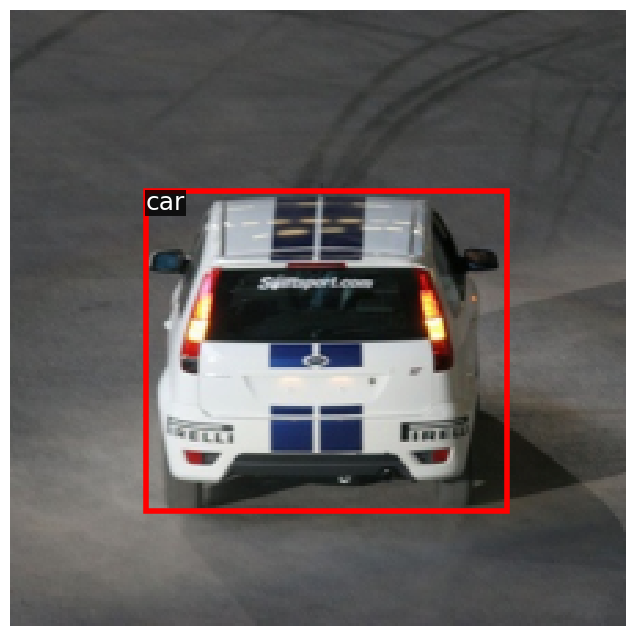

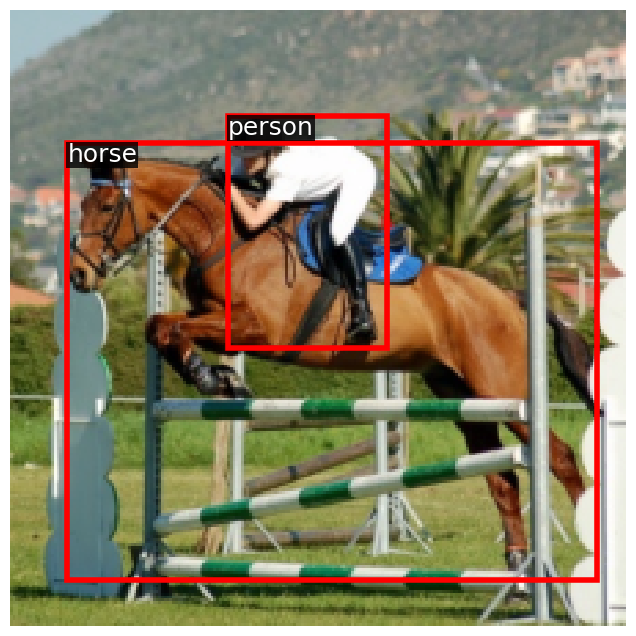

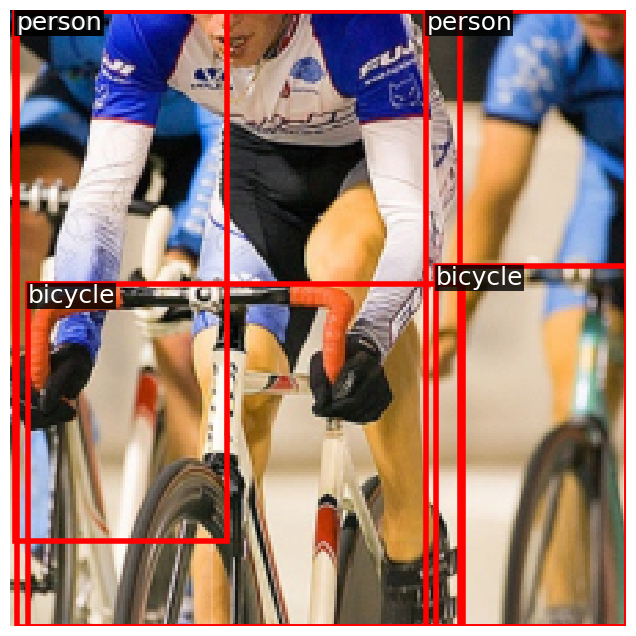

In [10]:
from torchvision import transforms

inverse_norm = transforms.Compose(
    [
        transforms.Normalize(mean=[0., 0., 0.], std=[1 / 0.229, 1 / 0.224, 1 / 0.225]),
        transforms.Normalize(mean=[-0.485, -0.456, -0.406], std=[1., 1., 1.]),
    ]
)

for idx, (_, image, gt_boxes) in enumerate(train_dataset):
    if idx > 2:
        break

    image = inverse_norm(image)
    is_valid = gt_boxes[:, 4] >= 0
    detection_visualizer(image, val_dataset.idx_to_class, gt_boxes[is_valid])

## Backbone with Feature Pyramid Networks (FPN)

Faster R-CNN uses a convolutional backbone with FPN in the exact same way as you implemented in FCOS. So you can directly re-use it for this part of the assignment.
*italicised text*
**NOTE:** Typical state-of-the-art detectors based o nFaster R-CNN use four multi-scale features from different FPN levels — `(p2, p3, p4, p5)` with strides `(4, 8, 16, 32)`.
Due to computational limits of Google Colab, we will instead simply use `(p3, p4, p5)` features like FCOS.
In all your implementations for this part, you may assume that you will receive features from these three FPN levels (and may hard-code these names as Python strings). Your code will not be tested with `p2` FPN features and you will not lose points.

In [11]:
import torch



## This part requires changes

class DetectorBackboneWithFPN(nn.Module):
    """
    Detection backbone network: A tiny RegNet model coupled with a Feature
    Pyramid Network (FPN). This model takes in batches of input images with
    shape `(B, 3, H, W)` and gives features from three different FPN levels
    with shapes and total strides upto that level:

        - level p3: (out_channels, H /  8, W /  8)      stride =  8
        - level p4: (out_channels, H / 16, W / 16)      stride = 16
        - level p5: (out_channels, H / 32, W / 32)      stride = 32

    NOTE: We could use any convolutional network architecture that progressively
    downsamples the input image and couple it with FPN. We use a small enough
    backbone that can work with Colab GPU and get decent enough performance.
    """
    # B = 2, H = 224, W = 224
    def __init__(self, out_channels: int):
        super().__init__()
        self.out_channels = out_channels

        # Initialize with ImageNet pre-trained weights.
        _cnn = models.regnet_x_400mf(pretrained=True)

        # Torchvision models only return features from the last level. Detector
        # backbones (with FPN) require intermediate features of different scales.
        # So we wrap the ConvNet with torchvision's feature extractor. Here we
        # will get output features with names (c3, c4, c5) with same stride as
        # (p3, p4, p5) described above.
        self.backbone = feature_extraction.create_feature_extractor(
            _cnn,
            return_nodes={
                "trunk_output.block2": "c3",
                "trunk_output.block3": "c4",
                "trunk_output.block4": "c5",
            },
        )

        # Pass a dummy batch of input images to infer shapes of (c3, c4, c5).
        # Features are a dictionary with keys as defined above. Values are
        # batches of tensors in NCHW format, that give intermediate features
        # from the backbone network.
        dummy_out = self.backbone(torch.randn(2, 3, 224, 224))
        dummy_out_shapes = [(key, value.shape) for key, value in dummy_out.items()]
        print("For dummy input images with shape: (2, 3, 224, 224)")
        for level_name, feature_shape in dummy_out_shapes:
            print(f"Shape of {level_name} features: {feature_shape}")

        self.fpn_params = nn.ModuleDict({
            'lateralThree': nn.Conv2d(64, self.out_channels, 1, stride = 1, padding = 0),
            'lateralFour': nn.Conv2d(160, self.out_channels, 1, stride = 1, padding = 0),
            'lateralFive': nn.Conv2d(400, self.out_channels, 1, stride = 1, padding = 0),
            'outputThree': nn.Conv2d(self.out_channels, self.out_channels, 3, stride = 1, padding = 1),
            'outputFour': nn.Conv2d(self.out_channels, self.out_channels, 3, stride = 1, padding = 1),
            'outputFive': nn.Conv2d(self.out_channels, self.out_channels, 3, stride = 1, padding = 1)
        })

    @property
    def fpn_strides(self):
        """
        Total stride up to the FPN level. For a fixed ConvNet, these values
        are invariant to input image size. You may access these values freely
        to implement your logic in FCOS / Faster R-CNN.
        """
        return {"p3": 8, "p4": 16, "p5": 32}

    def forward(self, images: torch.Tensor):

        # Multi-scale features, dictionary with keys: {"c3", "c4", "c5"}.
        backbone_feats = self.backbone(images)

        fpn_feats = {"p3": None, "p4": None, "p5": None}

        # TODO 2: Feature Pyramid Network (FPN)
        ######################################################################
        #                            START YOUR CODE                         #
        ######################################################################
        # Retrieve multi-scale features from backbone_feats
        # Indices should be c3, c4, and c5
        c3 = backbone_feats["c3"]
        c4 = backbone_feats["c4"]
        c5 = backbone_feats["c5"]

        # Retrieve lateral conv layers from self.fpn_params and pass the above multi-scale features
        # Indices should be lateralThree, lateralFour, and LateralFive
        c3 = self.fpn_params['lateralThree'](c3)
        c4 = self.fpn_params['lateralFour'](c4)
        c5 = self.fpn_params['lateralFive'](c5)
        # Top down according to paper feature pyramid network
        # Retrieve output layers from self.fpn_params and pass features from top to down
        # At each step, you should use torch.nn.functional.interpolate to interpolate the output from the previous layer to match the dimension of the current layer and add them to fuse features from different layers
        p5 = self.fpn_params['outputFive'](c5)
        p4 = self.fpn_params['outputFour'](c4 + torch.nn.functional.interpolate(p5, size=c4.shape[-2:], mode='nearest')) # shape `(B, 3, H, W)` and gives features from three different FPN levels [-2:] selects height and width
        p3 = self.fpn_params['outputThree'](c3 + torch.nn.functional.interpolate(p4, size=c3.shape[-2:], mode='nearest'))

        ######################################################################
        #                            END OF YOUR CODE                        #
        ######################################################################

        fpn_feats["p3"] = p3
        fpn_feats["p4"] = p4
        fpn_feats["p5"] = p5


        return fpn_feats



backbone = DetectorBackboneWithFPN(out_channels=64)

# Pass a batch of dummy images (random tensors) in NCHW format and observe the output.
dummy_images = torch.randn(2, 3, 224, 224)

# Collect dummy output.
dummy_fpn_feats = backbone(dummy_images)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=RegNet_X_400MF_Weights.IMAGENET1K_V1`. You can also use `weights=RegNet_X_400MF_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/regnet_x_400mf-adf1edd5.pth" to /root/.cache/torch/hub/checkpoints/regnet_x_400mf-adf1edd5.pth
100%|██████████| 21.3M/21.3M [00:00<00:00, 104MB/s]


For dummy input images with shape: (2, 3, 224, 224)
Shape of c3 features: torch.Size([2, 64, 28, 28])
Shape of c4 features: torch.Size([2, 160, 14, 14])
Shape of c5 features: torch.Size([2, 400, 7, 7])


## Faster R-CNN first stage: Region Proposal Network (RPN)

We will now implement the first-stage of Faster R-CNN. It comprises a **Region Proposal Network (RPN)** that learns to predict general _object proposals_, which will then be used by the second stage to make final predictions.

**RPN prediction:** An input image is passed through the backbone and we obtain its FPN feature maps `(p3, p4, p5)`.
The RPN predicts multiple values at _every location on FPN features_. Faster R-CNN is _anchor-based_ — the model assumes that every location has multiple pre-defined boxes (called "anchors") and it predicts two measures per anchor, per FPN location:

1. **Objectness:** The likelihood of having _any_ object inside the anchor. This is similar to classification head in FCOS, except that this is _class-agnostic_: it only performs binary foreground/background classification.
2. **Box regression deltas:** 4-D "deltas" that _transform_ an anchor at that location to a ground-truth box.

![pred_scores2](https://miro.medium.com/max/918/1*wB3ctS9WGNmw6pP_kjLjgg.png)

**SIDE NOTE:** We will use the more common practice of predicting `k` logits and use a logistic regressor instead of `2k` scores (and 2-way softmax) as shown in Figure. This slightly reduces the number of trainable parameters.

This RPN is conceptually quite similar to a one-stage detector like FCOS.
The main differences with what you implemented in FCOS are: (1) RPN is anchor-based, and make predictions for multiple anchor boxes instead of location "points", (2) it performs class-agnostic object classification, and (3) it excludes centerness regression, which was inntroduced in FCOS itself, years after Faster R-CNN was published.

Like we saw in FCOS, each anchor will be matched with a GT box for supervision — we will get to it shortly.
For now, let's assume there are some `A` anchor boxes at every FPN location, and implement an RPN module.
Structurally, this module is similar to FCOS prediction network.
Now follow the instructions in `RPNPredictionNetwork` of `two_stage_detector.py` and implement layers to predict objectness and box regression deltas.
Execute the following cell to test your implementation:

In [12]:
#from two_stage_detector import RPNPredictionNetwork
from typing import List

## This section requires code changes
class RPNPredictionNetwork(nn.Module):
    """
    RPN prediction network that accepts FPN feature maps from different levels
    and makes two predictions for every anchor: objectness and box deltas.

    Faster R-CNN typically uses (p2, p3, p4, p5) feature maps. We will exclude
    p2 for have a small enough model for Colab.

    Conceptually this module is quite similar to `FCOSPredictionNetwork`.
    """

    def __init__(
        self, in_channels: int, stem_channels: List[int], num_anchors: int = 3
    ):
        """
        Args:
            in_channels: Number of channels in input feature maps. This value
                is same as the output channels of FPN.
            stem_channels: List of integers giving the number of output channels
                in each convolution layer of stem layers.
            num_anchors: Number of anchor boxes assumed per location (say, `A`).
                Faster R-CNN without an FPN uses `A = 9`, anchors with three
                different sizes and aspect ratios. With FPN, it is more common
                to have a fixed size dependent on the stride of FPN level, hence
                `A = 3` is default - with three aspect ratios.
        """
        super().__init__()

        self.num_anchors = num_anchors

        stem_rpn = []

        for i in range(len(stem_channels)):
          if i == 0:
            stem_layer = nn.Conv2d(in_channels, stem_channels[i], kernel_size=3, stride=1, padding=1, bias=True)
            nn.init.normal_(stem_layer.weight, mean=0, std=0.01)
            nn.init.zeros_(stem_layer.bias)
          else:
            stem_layer = nn.Conv2d(stem_channels[i-1], stem_channels[i], kernel_size=3, stride=1, padding=1, bias=True)
            nn.init.normal_(stem_layer.weight, mean=0, std=0.01)
            nn.init.zeros_(stem_layer.bias)

          stem_rpn.append(nn.ReLU(inplace=True))
          stem_rpn.append(stem_layer)

        # Wrap the layers defined by student into a `nn.Sequential` module:
        self.stem_rpn = nn.Sequential(*stem_rpn)


        ######################################################################
        # TODO 3: Create TWO 1x1 conv layers for individually to predict
        # objectness and box deltas for every anchor, at every location.
        #
        # Objectness is obtained by applying sigmoid to its logits. However,
        # DO NOT initialize a sigmoid module here. PyTorch loss functions have
        # numerically stable implementations with logits.
        ######################################################################

        ######################################################################
        #                            START YOUR CODE                        #
        ######################################################################
        #get the final output from stem channels
        #conv predict objectness
        # classfication layer (cls)
        final_channels = stem_channels[-1]
        self.pred_obj = nn.Conv2d(final_channels, num_anchors, kernel_size = 1, stride = 1, padding = 0, bias = True)
        # regression layer (reg)
        #conv predict box deltas, * 4 for 4 directions
        self.pred_box = nn.Conv2d(final_channels, 4*num_anchors, kernel_size = 1, stride = 1, padding = 0, bias = True)  # Box regression conv

        ######################################################################
        #                            END OF YOUR CODE                        #
        ######################################################################
        nn.init.normal_(self.pred_obj.weight, mean = 0, std = 0.01)
        nn.init.zeros_(self.pred_obj.bias)
        nn.init.normal_(self.pred_box.weight, mean = 0, std = 0.01)
        nn.init.zeros_(self.pred_box.bias)


    def forward(self, feats_per_fpn_level: TensorDict) -> List[TensorDict]:
        """
        Accept FPN feature maps and predict desired quantities for every anchor
        at every location. Format the output tensors such that feature height,
        width, and number of anchors are collapsed into a single dimension (see
        description below in "Returns" section) this is convenient for computing
        loss and perforning inference.

        Args:
            feats_per_fpn_level: Features from FPN, keys {"p3", "p4", "p5"}.
                Each tensor will have shape `(batch_size, fpn_channels, H, W)`.

        Returns:
            List of dictionaries, each having keys {"p3", "p4", "p5"}:
            1. Objectness logits:     `(batch_size, H * W * num_anchors)`
            2. Box regression deltas: `(batch_size, H * W * num_anchors, 4)`
        """

        object_logits = {}
        boxreg_deltas = {}
        # level = p3, p4, p5
        for level in feats_per_fpn_level:
          level_output = self.stem_rpn(feats_per_fpn_level[level])
          # TODO 3: Calculate the objectness logits and box regression deltas
          ######################################################################
          #                            START YOUR CODE                         #
          ######################################################################
          B,F,H,W = self.pred_obj(level_output).shape
          logits = self.pred_obj(level_output).reshape(B, H*W, self.num_anchors)
          deltas = self.pred_box(level_output).reshape(B, -1, 4*self.num_anchors)
          ######################################################################
          #                            END OF YOUR CODE                        #
          ######################################################################

          object_logits[level] = logits
          boxreg_deltas[level] = deltas




        return [object_logits, boxreg_deltas]



rpn_pred_net = RPNPredictionNetwork(
    in_channels=64, stem_channels=[64], num_anchors= 3
)

# Pass the dummy FPN feats to RPN prediction network and view its output shapes.
dummy_rpn_obj, dummy_rpn_box = rpn_pred_net(dummy_fpn_feats)

# Few expected outputs:
# Shape of p4 RPN objectness: torch.Size([2, 196, 3])
# Shape of p5 RPN box deltas: torch.Size([2, 49, 12])

print(f"\nFor dummy input images with shape: {dummy_images.shape}")
for level_name in dummy_fpn_feats.keys():
    print(f"Shape of {level_name} FPN features  : {dummy_fpn_feats[level_name].shape}")
    print(f"Shape of {level_name} RPN objectness: {dummy_rpn_obj[level_name].shape}")
    print(f"Shape of {level_name} RPN box deltas: {dummy_rpn_box[level_name].shape}")
    print("")


For dummy input images with shape: torch.Size([2, 3, 224, 224])
Shape of p3 FPN features  : torch.Size([2, 64, 28, 28])
Shape of p3 RPN objectness: torch.Size([2, 784, 3])
Shape of p3 RPN box deltas: torch.Size([2, 784, 12])

Shape of p4 FPN features  : torch.Size([2, 64, 14, 14])
Shape of p4 RPN objectness: torch.Size([2, 196, 3])
Shape of p4 RPN box deltas: torch.Size([2, 196, 12])

Shape of p5 FPN features  : torch.Size([2, 64, 7, 7])
Shape of p5 RPN objectness: torch.Size([2, 49, 3])
Shape of p5 RPN box deltas: torch.Size([2, 49, 12])



*italicised text*## Anchor-based Training of RPN

Now that we implemented this RPN head, our goal is to have it predict _high objectness_ and _accurate box deltas_ for anchors that are likely to contain objects.
Similar to first part of our assignment, we need to assign a target GT box to every RPN prediction for training supervision.

**Recall FCOS location matching:** FCOS matched every FPN feature map location with a GT box (or marked them background), based on a heuristic that a location whether that location was _inside_ any GT Box.
On the other hand, Faster R-CNN is anchor-based: instead of _locations_, it makes predictions with reference to some pre-defined _anchor boxes_, and matches each anchor with a single GT box if they have a high enough Intersection-over-Union (IoU).

In the next few cells, we will perform the following steps, which are procedurally very similar to what you have already done with FCOS:

1. **Anchor generation:** Generate a set of anchors for every location in FPN feature map.
2. **Anchor to GT matching:** Match these anchors with GT boxes based on their IoU-overlap.
3. **Format of box deltas:** Implement the tranformation functions to obtain _box deltas_ from GT boxes (model training supervision) and apply deltas to anchors (final proposal boxes for second stage).

Let's approach these steps, one at a time.

### Anchor Generation

Recall that you already implemented a function to get the absolute image co-ordinates of FPN feature map locations, for FCOS — in `get_fpn_location_coords` of `common.py`.
First we need to form multiple anchor boxes centered at these locations.
RPN defines square anchor boxes of size `scale * stride` at every location, where `stride` is the FPN level stride, and `scale` is a hyperparameter.
For example, anchor boxes for P5 level (`stride = 32`), with `scale = 2` will be boxes of `(64 x 64)` pixels.
RPN also considers anchors of different aspect ratios, apart from square anchor boxes —
follow the instructions in `generate_fpn_anchors` of `two_stage_detector.py` to implement creation of multiple anchor boxes per location.

Execute the next cell to verify your implementation:

In [13]:
#from common import get_fpn_location_coords
#from two_stage_detector import generate_fpn_anchors

## This section requires code changes

def get_fpn_location_coords(
    shape_per_fpn_level: Dict[str, Tuple],
    strides_per_fpn_level: Dict[str, int],
    dtype: torch.dtype = torch.float32,
    device: str = "cpu",
) -> Dict[str, torch.Tensor]:
    """
    Map every location in FPN feature map to a point on the image. This point
    represents the center of the receptive field of this location. We need to
    do this for having a uniform co-ordinate representation of all the locations
    across FPN levels, and GT boxes.

    Args:
        shape_per_fpn_level: Shape of the FPN feature level, dictionary of keys
            {"p3", "p4", "p5"} and feature shapes `(B, C, H, W)` as values.
        strides_per_fpn_level: Dictionary of same keys as above, each with an
            integer value giving the stride of corresponding FPN level.
            See `backbone.py` for more details.

    Returns:
        Dict[str, torch.Tensor]
            Dictionary with same keys as `shape_per_fpn_level` and values as
            tensors of shape `(H * W, 2)` giving `(xc, yc)` co-ordinates of the
            centers of receptive fields of the FPN locations, on input image.
    """

    # Set these to `(N, 2)` Tensors giving absolute location co-ordinates.
    location_coords = {
        level_name: None for level_name, _ in shape_per_fpn_level.items()
    }

    for level_name, feat_shape in shape_per_fpn_level.items():
        level_stride = strides_per_fpn_level[level_name]

        ######################################################################
        #                            START YOUR CODE                        #
        ######################################################################

        # extract pixel scales --> assemble vector --> dimension of the image
        H_size, W_size = feat_shape[-2:]
        #print(type(H_size - 1))

        Y_vector = torch.arange(0, H_size, device=device, dtype=dtype).repeat(W_size)
        X_vector = torch.arange(0, W_size, device=device, dtype=dtype).repeat_interleave(H_size)

        # map between feature map and impage points
        X_vector = (X_vector * level_stride).to(dtype).to(device) + level_stride // 2
        Y_vector = (Y_vector * level_stride).to(dtype).to(device) + level_stride // 2
        coord_vector = torch.stack([X_vector, Y_vector], dim = -1)
        coord_vector = coord_vector.reshape(-1, 2)

        location_coords[level_name] = coord_vector

        ######################################################################
        #                            END OF YOUR CODE                        #
        ######################################################################
        ######################################################################

    return location_coords



def generate_fpn_anchors(
    locations_per_fpn_level: TensorDict,
    strides_per_fpn_level: Dict[str, int],
    stride_scale: int,
    aspect_ratios: List[float] = [0.5, 1.0, 2.0],
):
    """
    Generate multiple anchor boxes at every location of FPN level. Anchor boxes
    should be in XYXY format and they should be centered at the given locations.

    Args:
        locations_per_fpn_level: Centers at different levels of FPN (p3, p4, p5),
            that are already projected to absolute co-ordinates in input image
            dimension. Dictionary of three keys: (p3, p4, p5) giving tensors of
            shape `(H * W, 2)` where H, W is the size of FPN feature map.
        strides_per_fpn_level: Dictionary of same keys as above, each with an
            integer value giving the stride of corresponding FPN level.
            See `common.py` for more details.
        stride_scale: Size of square anchor at every FPN levels will be
            `(this value) * (FPN level stride)`. Default is 4, which will make
            anchor boxes of size (32x32), (64x64), (128x128) for FPN levels
            p3, p4, and p5 respectively.
        aspect_ratios: Anchor aspect ratios to consider at every location. We
            consider anchor area to be `(stride_scale * FPN level stride) ** 2`
            and set new width and height of anchors at every location:
                new_width = sqrt(area / aspect ratio)
                new_height = area / new_width

    Returns:
        TensorDict
            Dictionary with same keys as `locations_per_fpn_level` and values as
            tensors of shape `(HWA, 4)` giving anchors for all locations
            per FPN level, each location having `A = len(aspect_ratios)` anchors.
            All anchors are in XYXY format and their centers align with locations.
    """

    # Set these to `(N, A, 4)` Tensors giving anchor boxes in XYXY format.
    anchors_per_fpn_level = {
        level_name: None for level_name, _ in locations_per_fpn_level.items()
    }

    for level_name, locations in locations_per_fpn_level.items():
        level_stride = strides_per_fpn_level[level_name]

        # List of `A = len(aspect_ratios)` anchor boxes.
        anchor_boxes = []
        for aspect_ratio in aspect_ratios:

            anchor_scale = torch.tensor((stride_scale * level_stride) ** 2)
            anchor_width = torch.sqrt(anchor_scale / aspect_ratio)
            anchor_height = aspect_ratio * anchor_width

            x_center = locations[:, 0]
            y_center = locations[:, 1]

            top = y_center - 0.5 * anchor_height
            left = x_center - 0.5 * anchor_width
            bottom = y_center + 0.5 * anchor_height
            right = x_center + 0.5 * anchor_width

            anchor_boxes.append(torch.stack([left, top, right, bottom], dim=-1))

        # shape: (A, H * W, 4)
        anchor_boxes = torch.stack(anchor_boxes)
        # Bring `H * W` first and collapse those dimensions.
        anchor_boxes = anchor_boxes.permute(1, 0, 2).contiguous().view(-1, 4)
        anchors_per_fpn_level[level_name] = anchor_boxes

    return anchors_per_fpn_level




# Sanity check: Get 2x2 location co-ordinates of p5 (original shape is 7x7).
locations = get_fpn_location_coords(
    shape_per_fpn_level={"p5": (2, 64, 2, 2)}, strides_per_fpn_level={"p5": 32}
)

print("P5 locations:\n", locations["p5"])

# Generate anchors for these locations.
anchors = generate_fpn_anchors(
    locations_per_fpn_level=locations,
    strides_per_fpn_level={"p5": 32},
    stride_scale=2,
    aspect_ratios=[0.5, 1.0, 2.0],
)

print("P5 anchors with different aspect ratios:")
print("P5 1:2 anchors:\n", anchors["p5"][0::3, :], "\n")
# Expected (any ordering is fine):
# [-29.2548,  -6.6274,  61.2548,  38.6274]
# [-29.2548,  25.3726,  61.2548,  70.6274]
# [  2.7452,  -6.6274,  93.2548,  38.6274]
# [  2.7452,  25.3726,  93.2548,  70.6274]

print("P5 1:1 anchors:\n", anchors["p5"][1::3, :], "\n")
# Expected (any ordering is fine):
# [-16., -16.,  48.,  48.]
# [-16.,  16.,  48.,  80.]
# [ 16., -16.,  80.,  48.]
# [ 16.,  16.,  80.,  80.]

print("P5 2:1 anchors:\n", anchors["p5"][2::3, :], "\n")
# Similar to 1:2 anchors, but with flipped co-ordinates

P5 locations:
 tensor([[16., 16.],
        [16., 48.],
        [48., 16.],
        [48., 48.]])
P5 anchors with different aspect ratios:
P5 1:2 anchors:
 tensor([[-29.2548,  -6.6274,  61.2548,  38.6274],
        [-29.2548,  25.3726,  61.2548,  70.6274],
        [  2.7452,  -6.6274,  93.2548,  38.6274],
        [  2.7452,  25.3726,  93.2548,  70.6274]]) 

P5 1:1 anchors:
 tensor([[-16., -16.,  48.,  48.],
        [-16.,  16.,  48.,  80.],
        [ 16., -16.,  80.,  48.],
        [ 16.,  16.,  80.,  80.]]) 

P5 2:1 anchors:
 tensor([[ -6.6274, -29.2548,  38.6274,  61.2548],
        [ -6.6274,   2.7452,  38.6274,  93.2548],
        [ 25.3726, -29.2548,  70.6274,  61.2548],
        [ 25.3726,   2.7452,  70.6274,  93.2548]]) 



### Matching anchor boxes with GT boxes

Similar to FCOS, we will now match these generated anchors with GT boxes. Faster R-CNN matches some `N` anchor boxes with `M` GT boxes by applying a simple rule:

> Anchor box $N_i$ is matched with box $M_i$ if it has an IoU overlap higher than 0.6 with that box. For multiple such GT boxes, the anchor is assigned with the GT box that has the highest IoU. Note that a single ground-truth box may assign positive labels to multiple anchors.

**NOTE:** _Faster R-CNN uses 0.7 default threshold_ as mentioned in the lecture slides. We use a lower threeshold to increase the number of positive matches for sampling — this helps in speeding up training in a resource constrained setting like Google Colab.

Anchor boxes with `IoU < 0.3` with ALL GT boxes is assigned background GT box `(-1, -1, -1, -1, -1)`. All other anchors with IoU between `(0.3, 0.6)` are considered "neutral" and ignored during training. This matching differs from FCOS, which assigns ALL anchors to either object or background — the "neutral" Faster R-CNN anchors cause wasted computation, and removing this redundancy would overly complicate our implementation.

We have implemented this matching procedure for you — see `rcnn_match_anchors_to_gt` of `two_stage_detector.py`.
Read its documentation to understand its input/output format, it is slightly different than `fcos_match_locations_to_gt`.
It serves the same purpose as location matching in FCOS — to define GT targets for model predictions during training.

This function internally requires IoU computation between all anchors and GT boxes — which you have to implement.
Follow the instructions in `two_stage_detector.py` to implement IoU computation, and execute the next cell for a sanity check — you should observe an error of `1e-7` or less

In [14]:
## This section requires code changes

def iou(boxes1: torch.Tensor, boxes2: torch.Tensor) -> torch.Tensor:
    """
    Compute intersection-over-union (IoU) between pairs of box tensors. Input
    box tensors must in XYXY format.

    Args:
        boxes1: Tensor of shape `(M, 4)` giving a set of box co-ordinates.
        boxes2: Tensor of shape `(N, 4)` giving another set of box co-ordinates.

    Returns:
        torch.Tensor
            Tensor of shape (M, N) with `iou[i, j]` giving IoU between i-th box
            in `boxes1` and j-th box in `boxes2`.
    """



    #print("boxes1 shape:", boxes1.shape)
    #print("boxes2 shape:", boxes2.shape)
    if boxes1.dim() == 1:
        boxes1 = boxes1.unsqueeze(0)
    if boxes2.dim() == 1:
        boxes2 = boxes2.unsqueeze(0)

    #print("boxes1 shape new:", boxes1.shape)
    #print("boxes2 shape new:", boxes2.shape)
    # intersection of 2 boxes is also a box, tl for top left, br for bottom right
    tl = torch.max(boxes1[:, None, :2], boxes2[:, :2])
    br = torch.min(boxes1[:, None, 2:], boxes2[:, 2:])

    # calculate intersection area for each set of coordinates, wh for width_height of the intersection
    wh = (br - tl).clamp(min = 0)
    inter_area = wh[:, :, 0] * wh[:, :, 1]

    # get box areas for boxes in boxes1 and boxes 2 respectively
    box_area_one = (boxes1[:, 2] - boxes1[:, 0]) * (boxes1[:, 3] - boxes1[:, 1])
    box_area_two = (boxes2[:, 2] - boxes2[:, 0]) * (boxes2[:, 3] - boxes2[:, 1])
    # get union area of the box by union definition
    union_area = box_area_one[:, None] + box_area_two - inter_area
    # iou
    iou = inter_area / union_area

    return iou


boxes1 = torch.Tensor([[10, 10, 90, 90], [20, 20, 40, 40], [60, 60, 80, 80]])
boxes2 = torch.Tensor([[10, 10, 90, 90], [60, 60, 80, 80], [30, 30, 70, 70]])

expected_iou = torch.Tensor(
    [[1.0, 0.0625, 0.25], [0.0625, 0.0, 0.052631579], [0.0625, 1.0, 0.052631579]]
)
result_iou = iou(boxes1, boxes2)
print("result iou", result_iou)

print("Relative error:", rel_error(expected_iou, result_iou))

result iou tensor([[1.0000, 0.0625, 0.2500],
        [0.0625, 0.0000, 0.0526],
        [0.0625, 1.0000, 0.0526]])
Relative error: 0.0


### Visualizing matched GT boxes

Now we apply our anchor matching function and visualize one GT box with a random matched positive anchor box.
You may try different images by indexing `train_dataset` below,
make sure to try different FPN levels as certain images may not get any matched GT boxes due to their size.

Unlabeled red box is positive anchor:


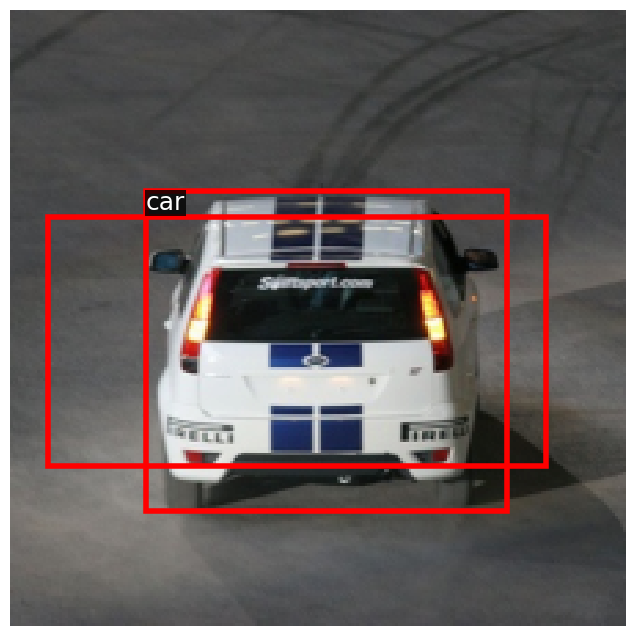

In [15]:
# import random
# from common import get_fpn_location_coords
# from two_stage_detector import generate_fpn_anchors, rcnn_match_anchors_to_gt


# Sanity check: Match anchors of p4 level with GT boxes of first image
# in the training dataset.
_, image, gt_boxes = train_dataset[0]

FPN_LEVEL = "p4"
FPN_STRIDE = 16
locations = get_fpn_location_coords(
    shape_per_fpn_level={FPN_LEVEL: (2, 64, 224 // FPN_STRIDE, 224 // FPN_STRIDE)},
    strides_per_fpn_level={FPN_LEVEL: FPN_STRIDE}
)
# Generate anchors for these locations.
anchors = generate_fpn_anchors(
    locations_per_fpn_level=locations,
    strides_per_fpn_level={FPN_LEVEL: FPN_STRIDE},
    stride_scale=8,  # Default value used by Faster R-CNN
    aspect_ratios=[0.5, 1.0, 2.0],
)

matched_gt_boxes = rcnn_match_anchors_to_gt(
    anchors[FPN_LEVEL], gt_boxes, iou_thresholds = (0.3, 0.6)
)

# Flatten anchors and matched boxes:
anchors_p4 = anchors[FPN_LEVEL].view(-1, 4)
matched_boxes_p4 = matched_gt_boxes.view(-1, 5)

# Visualize one selected anchor and its matched GT box.
# NOTE: Run this cell multiple times to see different matched anchors. For car
# image, p3/5 will not work because the GT box was already assigned to p4.
fg_idxs_p4 = (matched_boxes_p4[:, 4] > 0).nonzero()
fg_idx = random.choice(fg_idxs_p4)

# Combine both boxes for visualization:
dummy_vis_boxes = [anchors_p4[fg_idx][0], matched_boxes_p4[fg_idx][0]]

print("Unlabeled red box is positive anchor:")
detection_visualizer(
    inverse_norm(image),
    val_dataset.idx_to_class,
    bbox=dummy_vis_boxes,
)

### GT Targets for box regression

Now we work on the third and final component needed to train our RPN — we define transformation functions for box regression deltas :

> 1. `fcos_get_deltas_from_locations`: Accepts locations (centers) and GT boxes, and returns deltas. Required for training supervision.
> 2. `fcos_apply_deltas_to_locations`: Accepts predicted deltas and locations, and returns predicted boxes. Required during inference.

Here you will implement similar transformation functions for R-CNN. You can use the ideas from the slides frmo the class and implement two functions:

1. `rcnn_get_deltas_from_anchors`: Accepts anchor boxes and GT boxes, and returns deltas. Required for training supervision.
2. `rcnn_apply_deltas_to_anchors`: Accepts predicted deltas and anchor boxes, and returns predicted boxes. Required during inference.

Run the following cell to check your implementation.

In [16]:
## This section code changes
import math

def rcnn_get_deltas_from_anchors(
    anchors: torch.Tensor, gt_boxes: torch.Tensor
) -> torch.Tensor:
    """
    Get box regression deltas that transform `anchors` to `gt_boxes`. These
    deltas will become GT targets for box regression. Unlike FCOS, the deltas
    are in `(dx, dy, dw, dh)` format that represent offsets to anchor centers
    and scaling factors for anchor size. Box regression is only supervised by
    foreground anchors. If GT boxes are "background/neutral", then deltas
    must be `(-1e8, -1e8, -1e8, -1e8)` (just some LARGE negative number).

    Args:
        anchors: Tensor of shape `(N, 4)` giving anchors boxes in XYXY format.
        gt_boxes: Tensor of shape `(N, 4)` giving matching GT boxes.

    Returns:
        torch.Tensor
            Tensor of shape `(N, 4)` giving anchor deltas.
    """

    # tranform anchor box format from XYXY to XYWH so can calculate deltas in (dx, xy, dw, dh)
    anchor_centers = (anchors[:, :2] + anchors[:, 2:]) / 2
    anchor_sizes = anchors[:, 2:] - anchors[:, :2]

    # similarly, transform from XYXY to XYWH
    gt_centers = (gt_boxes[:, :2] + gt_boxes[:, 2:4]) / 2
    gt_sizes = gt_boxes[:, 2:4] - gt_boxes[:, :2]

    # get deltas and seperate fg_indices from bg_indices based on dummy class ID, <0 --> background, >0 --> fore
    deltas = torch.zeros((anchors.shape[0], 4))
    fg_indices = torch.where(gt_boxes[:, 4] > 0)[0]

    # if foreground
    if fg_indices.shape[0] > 0:
        # calculate center coord delta
        delta_x = (gt_centers[fg_indices, 0] - anchor_centers[fg_indices, 0]) / anchor_sizes[fg_indices, 0]
        delta_y = (gt_centers[fg_indices, 1] - anchor_centers[fg_indices, 1]) / anchor_sizes[fg_indices, 1]
        # calculate width and height delta
        delta_w = torch.log(gt_sizes[fg_indices, 0] / anchor_sizes[fg_indices, 0])
        delta_h = torch.log(gt_sizes[fg_indices, 1] / anchor_sizes[fg_indices, 1])
        # assemble the overall --> (dx, dy, dw, dh)
        deltas[fg_indices] = torch.stack([delta_x, delta_y, delta_w, delta_h], dim=1)
    else:
        bg_indices = torch.where(gt_boxes[:, 4] <= 0)[0]
        deltas[bg_indices] = -1e8

    return deltas



def rcnn_apply_deltas_to_anchors(
    deltas: torch.Tensor, anchors: torch.Tensor
) -> torch.Tensor:
    """
    Implement the inverse of `rcnn_get_deltas_from_anchors` here.

    Args:
        deltas: Tensor of shape `(N, 4)` giving box regression deltas.
        anchors: Tensor of shape `(N, 4)` giving anchors to apply deltas on.

    Returns:
        torch.Tensor
            Same shape as deltas and locations, giving the resulting boxes in
            XYXY format.
    """

    # Clamp dw and dh such that they would transform a 8px box no larger than
    # 224px. This is necessary for numerical stability as we apply exponential.
    scale_clamp = math.log(224 / 8)
    deltas[:, 2] = torch.clamp(deltas[:, 2], max=scale_clamp)
    deltas[:, 3] = torch.clamp(deltas[:, 3], max=scale_clamp)

    output_boxes = None

    # transform anchor from XYXY to XYWH, same logic as in the above function
    anchor_widths = anchors[:, 2] - anchors[:, 0]
    anchor_heights = anchors[:, 3] - anchors[:, 1]
    anchor_centers_x = anchors[:, 0] + 0.5 * anchor_widths
    anchor_centers_y = anchors[:, 1] + 0.5 * anchor_heights

    # get the delta for centers, width, and heights
    dx = deltas[:, 0]
    dy = deltas[:, 1]
    dw = deltas[:, 2]
    dh = deltas[:, 3]

    # compute predicted box, centers using delta for (x, y), and box width and heights with delta for width and heights
    pred_centers_x = anchor_centers_x + anchor_widths * dx
    pred_centers_y = anchor_centers_y + anchor_heights * dy
    pred_widths = anchor_widths * torch.exp(dw)
    pred_heights = anchor_heights * torch.exp(dh)

    # combine x, y for center, width and height for predicted box size
    pred_centers = torch.stack([pred_centers_x, pred_centers_y], dim=1)
    pred_sizes = torch.stack([pred_widths, pred_heights], dim=1)

    # transform predicted center coordinates, width, and height into the XYXY format of the bounding boxes
    output_boxes = torch.zeros_like(deltas)
    output_boxes[:, :2] = pred_centers - pred_sizes / 2
    output_boxes[:, 2:] = pred_centers + pred_sizes / 2

    #print("rcnn apply delta to anchor output box shape" ,output_boxes.shape)

    return output_boxes




# Three hard-coded anchor boxes and GT boxes that have a fairly high overlap.
# Add a dummy class ID = 1 indicating foreground
input_anchors = torch.Tensor(
    [[20, 40, 80, 90], [10, 10, 50, 50], [120, 100, 200, 200]]
)
input_boxes = torch.Tensor(
    [[10, 15, 100, 115, 1], [30, 20, 40, 30, 1], [120, 100, 200, 200, 1]]
)

# Here we do a simple sanity check - getting deltas for a particular set of boxes
# and applying them back to anchors should give us the same boxes.
_deltas = rcnn_get_deltas_from_anchors(input_anchors, input_boxes)
output_boxes = rcnn_apply_deltas_to_anchors(_deltas, input_anchors)

print("Rel error in reconstructed boxes:", rel_error(input_boxes[:, :4], output_boxes))

# Another check: deltas for GT class label = -1 should be -1e8
background_box = torch.Tensor([[-1, -1, -1, -1, -1]])
input_anchor = torch.Tensor([[100, 100, 200, 200]])

_deltas = rcnn_get_deltas_from_anchors(input_anchor, background_box)
output_box = rcnn_apply_deltas_to_anchors(_deltas, input_anchor)

print("Background deltas should be all -1e8  :", _deltas)
print("Output box should be -1e8 or lower    :", output_box)

Rel error in reconstructed boxes: 0.0
Background deltas should be all -1e8  : tensor([[-100000000., -100000000., -100000000., -100000000.]])
Output box should be -1e8 or lower    : tensor([[-1.0000e+10, -1.0000e+10, -1.0000e+10, -1.0000e+10]])


## Loss Functions

With all predictions assigned with GT targets, we will proceed to compute losses for training the RPN.
Recall that you used [Focal Loss](https://arxiv.org/abs/1708.02002) for classification and L1 loss for box regression in FCOS.
Here, you will use L1 loss for box regression, similar to FCOS.

**Objectness classification loss:** Focal Loss was proposed in RetinaNet (2017) to deal with heavy class imbalance caused by "background". Faster R-CNN predates this paper — it dealt with class imbalance by randomly sampling roughly equal amount of foreground-background anchors to train RPN. We have implemented a very simple sampling function for you in `sample_rpn_training` function of `two_stage_detector.py` — you may directly use it while you piece all these components (coming up next).

**Total loss** is the sum of both loss components _per sampled anchor_, averaged by total number of foreground + background anchors.


In [17]:

# Sanity check: dummy predictions from model - box regression deltas and
# objectness logits for two anchors.
# shape: (batch_size, HWA, 4 or 1)
dummy_pred_boxreg_deltas = torch.randn(1, 2, 4)
dummy_pred_obj_logits = torch.randn(1, 2, 1)

# Dummy deltas and objectness targets. Let the second box be background.
# Dummy GT boxes (matched with both anchors).
dummy_gt_deltas = torch.randn_like(dummy_pred_boxreg_deltas)
dummy_gt_deltas[:, 1, :] = -1e8

# Background objectness targets should be 0 (not -1), and foreground
# should be 1. Neutral anchors will not occur here due to sampling.
dummy_gt_objectness = torch.Tensor([1, 0])

# Note that loss is not multiplied with 0.25 here:
loss_box = F.l1_loss(
    dummy_pred_boxreg_deltas, dummy_gt_deltas, reduction="none"
)

# No loss for background anchors:
loss_box[dummy_gt_deltas == -1e8] *= 0.0
print("Box regression loss (L1):", loss_box)

# Now calculate objectness loss.
loss_obj = F.binary_cross_entropy_with_logits(
    dummy_pred_obj_logits.view(-1), dummy_gt_objectness, reduction="none"
)
print("Objectness loss (BCE):", loss_obj)

Box regression loss (L1): tensor([[[0.3407, 0.3870, 1.1565, 2.2783],
         [0.0000, 0.0000, 0.0000, 0.0000]]])
Objectness loss (BCE): tensor([1.3940, 2.3477])


## Putting it all together: RPN module

Now you will put together all the things you have implemented into the `RPN` class in `two_stage_detector.py`.
Implement `forward` and `predict_proposals` functions of this module — you have already done most of the heavy lifting, you simply need to call all the functions in a correct way!
Use the previous two cells as a reference to implement loss calculation in `forward()`.

**TIP:** It may help if you draw analogies between the implementation logic in this module vs FCOS (`RPN.predict_proposals()` -> `FCOS.inference()`).

## Overfit small data

In Faster R-CNN, the RPN is trained jointly with the second-stage network.
However, to test our RPN implementation, we will first train just the RPN — this is basically a class-agnostic FCOS without centerness.
We will use the `train_detector` function that we used for training FCOS.
You can read its implementation in `a4_helper.py`.

The loss should generally do down, however the forward pass here is a bit slower than FCOS.

In [18]:

## This section requires code changes
#import generate_fpn_anchors, rcnn_match_anchors_to_gt, sample_rpn_training
import torchvision

class RPN(nn.Module):
    """
    Region Proposal Network: First stage of Faster R-CNN detector.

    This class puts together everything you implemented so far. It accepts FPN
    features as input and uses `RPNPredictionNetwork` to predict objectness and
    box reg deltas. Computes proposal boxes for second stage (during both
    training and inference) and losses during training.
    """

    def __init__(
        self,
        fpn_channels: int,
        stem_channels: List[int],
        batch_size_per_image: int,
        anchor_stride_scale: int = 8,
        anchor_aspect_ratios: List[int] = [0.5, 1.0, 2.0],
        anchor_iou_thresholds: Tuple[int, int] = (0.3, 0.6),
        nms_thresh: float = 0.7,
        pre_nms_topk: int = 400,
        post_nms_topk: int = 100,
    ):
        """
        Args:
            batch_size_per_image: Anchors per image to sample for training.
            nms_thresh: IoU threshold for NMS - unlike FCOS, this is used
                during both, training and inference.
            pre_nms_topk: Number of top-K proposals to select before applying
                NMS, per FPN level. This helps in speeding up NMS.
            post_nms_topk: Number of top-K proposals to select after applying
                NMS, per FPN level. NMS is obviously going to be class-agnostic.

        Refer explanations of remaining args in the classes/functions above.
        """
        super().__init__()
        self.pred_net = RPNPredictionNetwork(
            fpn_channels, stem_channels, num_anchors=len(anchor_aspect_ratios)
        )
        # Record all input arguments:
        self.batch_size_per_image = batch_size_per_image
        self.anchor_stride_scale = anchor_stride_scale
        self.anchor_aspect_ratios = anchor_aspect_ratios
        self.anchor_iou_thresholds = anchor_iou_thresholds
        self.nms_thresh = nms_thresh
        self.pre_nms_topk = pre_nms_topk
        self.post_nms_topk = post_nms_topk
        self.device = torch.device("cuda")

    def forward(
        self,
        feats_per_fpn_level: TensorDict,
        strides_per_fpn_level: TensorDict,
        gt_boxes: Optional[torch.Tensor] = None,
    ):
        # Get batch size from FPN feats:
        num_images = feats_per_fpn_level["p3"].shape[0]

        # step 1: Pass the FPN features per level to the RPN prediction network. --> checked
        pred_obj_logits, pred_boxreg_deltas = self.pred_net(feats_per_fpn_level)

        # step 2: Generate anchor boxes for all FPN levels. --> checked
        # based on get_fpn_location_coords comments:
        # shape_per_fpn_level --> Shape of the FPN feature level, dictionary of keys {"p3", "p4", "p5"} and feature shapes `(B, C, H, W)` as values.
        # strides_per_fpn_level: Dictionary of same keys as above, each with an integer value giving the stride of corresponding FPN level.

        #print("p3 feature shape", feats_per_fpn_level["p3"].shape)
        #print("iou threshold value", self.anchor_iou_thresholds)

        shape_per_fpn_level = {
          "p3": feats_per_fpn_level["p3"].shape,
          "p4": feats_per_fpn_level["p4"].shape,
          "p5": feats_per_fpn_level["p5"].shape
        }

        strides_per_fpn_level = {
          "p3": strides_per_fpn_level["p3"],
          "p4": strides_per_fpn_level["p4"],
          "p5": strides_per_fpn_level["p5"]
        }

        locations_per_fpn_level = get_fpn_location_coords(shape_per_fpn_level, strides_per_fpn_level) # input logic checked, input for sample anchor function
        anchors_per_fpn_level = {}

        #print("locations", locations_per_fpn_level)
        anchors_per_fpn_level = generate_fpn_anchors(
            locations_per_fpn_level,
            strides_per_fpn_level,
            self.anchor_stride_scale,
            self.anchor_aspect_ratios
        ) # checked


        # We will fill three values in this output dict - "proposals",
        # "loss_rpn_box" (training only), "loss_rpn_obj" (training only)
        output_dict = {}

        # Get image height and width according to feature sizes and strides.
        # We need these to clamp proposals (These should be (224, 224) but we
        # avoid hard-coding them).
        img_h = feats_per_fpn_level["p3"].shape[2] * strides_per_fpn_level["p3"]
        img_w = feats_per_fpn_level["p3"].shape[3] * strides_per_fpn_level["p3"]

        # STUDENT: Implement this method before moving forward with the rest
        # of this `forward` method.
        output_dict["proposals"] = self.predict_proposals(
            anchors_per_fpn_level,
            pred_obj_logits,
            pred_boxreg_deltas,
            (img_w, img_h),
        )
        # Return here during inference - loss computation not required.
        if not self.training:
            return output_dict

        # ... otherwise continue loss computation:
        # Combine anchor boxes from all FPN levels - we do not need any
        # distinction of boxes across different levels (for training).
        anchor_boxes = self._cat_across_fpn_levels(anchors_per_fpn_level, dim=0)

        # Get matched GT boxes (list of B tensors, each of shape `(H*W*A, 5)`
        # giving matching GT boxes to anchor boxes). Fill this list:
        matched_gt_boxes = []

        # not batched, iterate through each image to apply delta to all anchor boxes of the image, match generated anchors with provided GT boxes
        # checked

        for i in range(num_images):
          #print("anchor_box for match", anchor_boxes)
          #print("anchor_box shape for match", anchor_boxes.shape)
          #print("gt_box for match", gt_boxes[i])
          #print("gt_box shape for match", gt_boxes[i].shape)
          matched_boxes = rcnn_match_anchors_to_gt(anchor_boxes, gt_boxes[i], self.anchor_iou_thresholds)
          #print("matched_boxes", matched_boxes)
          matched_gt_boxes.append(matched_boxes)


        # Combine matched boxes from all images to a `(B, HWA, 5)` tensor.
        matched_gt_boxes = torch.stack(matched_gt_boxes, dim=0)

        # Combine predictions across all FPN levels.
        pred_obj_logits = self._cat_across_fpn_levels(pred_obj_logits)
        pred_boxreg_deltas = self._cat_across_fpn_levels(pred_boxreg_deltas)

        if self.training:
            # Repeat anchor boxes `batch_size` times so there is a 1:1
            # correspondence with GT boxes.
            anchor_boxes = anchor_boxes.unsqueeze(0).repeat(num_images, 1, 1)
            anchor_boxes = anchor_boxes.contiguous().view(-1, 4)

            # Collapse `batch_size`, and `HWA` to a single dimension so we have
            # simple `(-1, 4 or 5)` tensors. This simplifies loss computation.
            matched_gt_boxes = matched_gt_boxes.view(-1, 5)
            pred_obj_logits = pred_obj_logits.view(-1)
            pred_boxreg_deltas = pred_boxreg_deltas.view(-1, 4)

            # Feel free to delete this line: (but keep variable names same)
            loss_obj, loss_box = None, None
            # Step 1: Sample a few anchor boxes for training. C
            #torch.set_printoptions(threshold=5000)
            #print("matched_gt_boxes", matched_gt_boxes)
            #print("self.batch_size_per_image", self.batch_size_per_image)

            # TODO 4: Positive and negative sampling
            # Sample a few anchor boxes for training. Pass the variable
            # `matched_gt_boxes` to `sample_rpn_training` function and
            # use those indices to get subset of predictions and targets.
            # RPN samples 50-50% foreground/background anchors, unless
            # there aren't enough foreground anchors.
            ######################################################################
            #                            START YOUR CODE                         #
            ######################################################################
            positive_inds, negative_inds =  sample_rpn_training(matched_gt_boxes, num_images* self.batch_size_per_image, 0.5)
        ######################################################################
            ##########################################################################
            #                             END OF YOUR CODE                           #
            ##########################################################################
            # combine indices for the sample. C
            sampled_inds = torch.cat((positive_inds, negative_inds), dim=0)
            #print("sampled_inds", sampled_inds)
            sampled_anchor_boxes = anchor_boxes[sampled_inds]
            #print("sampled_anchor_boxes", sampled_anchor_boxes)
            sampled_matched_gt_boxes = matched_gt_boxes[sampled_inds]
            #print("sampled_matched_gt_boxes", sampled_matched_gt_boxes)
            sampled_pred_obj_logits = pred_obj_logits[sampled_inds]
            #print("sampled_pred_obj_logits", sampled_pred_obj_logits)
            sampled_pred_boxreg_deltas = pred_boxreg_deltas[sampled_inds]
            #print("sampled_pred_boxreg_deltas", sampled_pred_boxreg_deltas)

            # Step 2: Compute GT targets for box regression
            gt_boxreg_targets = rcnn_get_deltas_from_anchors(sampled_anchor_boxes, sampled_matched_gt_boxes)

            # Step 3: Calculate objectness and box reg losses per sampled anchor.
            anchor_labels = torch.zeros(sampled_inds.shape[0], device=sampled_pred_obj_logits.device)
            # set the values to 1 for positive indices
            anchor_labels[:positive_inds.shape[0]] = 1
            loss_obj = F.binary_cross_entropy_with_logits(
                sampled_pred_obj_logits, anchor_labels, reduction="none"
            )
            #print("loss_obj", loss_obj)
            loss_box = F.smooth_l1_loss(
                sampled_pred_boxreg_deltas, gt_boxreg_targets, reduction="none"
            )

            # set box loss for "background" anchors to 0

            # print(sampled_matched_gt_boxes[:, 4] > 0)
            loss_box[sampled_matched_gt_boxes[:, 4] == -1] *= 0
            #print("loss_box", loss_box)
            #loss_box = loss_box.mean()






            # Sum losses and average by num(foreground + background) anchors.
            # In training code, we simply add these two and call `.backward()`
            total_batch_size = self.batch_size_per_image * num_images
            output_dict["loss_rpn_obj"] = max(loss_obj.sum(),0) / total_batch_size
            output_dict["loss_rpn_box"] = max(loss_box.sum(),0) / total_batch_size

        return output_dict

    @torch.no_grad()  # Don't track gradients in this function.
    def predict_proposals(
        self,
        anchors_per_fpn_level: Dict[str, torch.Tensor],
        pred_obj_logits: Dict[str, torch.Tensor],
        pred_boxreg_deltas: Dict[str, torch.Tensor],
        image_size: Tuple[int, int],  # (width, height)
    ):
        """
        Predict proposals for a batch of images for the second stage. Other
        input arguments are same as those computed in `forward` method. This
        method should not be called from anywhere except from inside `forward`.

        Returns:
            torch.Tensor
                proposals: Tensor of shape `(keep_topk, 4)` giving *absolute*
                    XYXY co-ordinates of predicted proposals. These will serve
                    as anchor boxes for the second stage.
        """

        # Gather proposals from all FPN levels in this list.
        proposals_all_levels = {
            level_name: None for level_name, _ in anchors_per_fpn_level.items()
        }
        for level_name in anchors_per_fpn_level.keys():

            # Get anchor boxes and predictions from a single level.
            level_anchors = anchors_per_fpn_level[level_name]

            # shape: (batch_size, HWA), (batch_size, HWA, 4)
            level_obj_logits = pred_obj_logits[level_name]
            level_boxreg_deltas = pred_boxreg_deltas[level_name]

            # Fill proposals per image, for this FPN level, in this list.
            level_proposals_per_image = []
            for _batch_idx in range(level_obj_logits.shape[0]):

                # Reshape box regression deltas to match anchors
                device = level_anchors.device
                num_boxes = level_boxreg_deltas.shape[1]
                num_anchors = level_anchors.shape[0]
                num_deltas = level_boxreg_deltas.shape[1]

                #print("shape for level_boxreg_deltas[_batch_idx]", level_boxreg_deltas[_batch_idx].shape)
                #print("shape for level_obj_logits", level_obj_logits.shape)
                level_boxreg_deltas_image = level_boxreg_deltas[_batch_idx]
                #print("level_boxreg_deltas", level_boxreg_deltas)

                A = level_boxreg_deltas_image.size(0)
                N = 3 * A
                # Transform the tensor to shape (N, 4)
                level_boxreg_deltas_image = level_boxreg_deltas_image.reshape(N, 4)
                #print("boxreg_deltas dimension", level_boxreg_deltas_image.shape)

                #level_anchors.to(self.device)
                # level_boxreg_deltas shape (2352, 4)
                # level_obj_logits has shape (16, 784, 12)
                # level_anchors shape (2352, 4)
                level_boxreg_deltas_image = level_boxreg_deltas_image.to(device)

                # Step 1: Transform the anchors to proposal boxes using predicted box deltas
                #print("anchor shape", level_anchors.shape)
                # proposal_boxes shape (2352, 4)
                proposal_boxes = rcnn_apply_deltas_to_anchors(level_boxreg_deltas_image, level_anchors)

                proposal_boxes[:, [0, 2]] = proposal_boxes[:, [0, 2]].clamp(min = 0, max=image_size[0])
                proposal_boxes[:, [1, 3]] = proposal_boxes[:, [1, 3]].clamp(min = 0, max=image_size[1])
                # Calculate the objectness score by taking softmax over class logits
                objectness = torch.softmax(level_obj_logits[_batch_idx], dim = -1)[:, 1]

                # Get indices of top-k proposals
                #print("objectness length", torch.numel(objectness))
                #print("pre_nms_topk value", self.pre_nms_topk)
                if torch.numel(objectness) < self.pre_nms_topk:
                  curr_pre_nms_topk = torch.numel(objectness)
                else:
                  curr_pre_nms_topk = self.pre_nms_topk
                topk = torch.topk(objectness, curr_pre_nms_topk, dim=0, sorted=True)
                topk_indices = topk.indices.to(device)

                # Filter out the top-k proposals
                proposal_boxes = proposal_boxes[topk_indices]
                objectness = objectness[topk_indices]

                # Stack the objectness scores with the proposal boxes
                proposals = torch.cat([proposal_boxes.to(device), objectness.to(device).unsqueeze(-1)], dim = -1)

                # Step 3: Apply NMS and retain `keep_topk_per_level` proposals per image, per level

                # Apply NMS
                keep_topk_per_level = torchvision.ops.nms(proposal_boxes, objectness, self.nms_thresh)

                # Filter out the proposals after NMS
                proposals_after_nms = proposals[keep_topk_per_level]

                # Append the proposals for the current image to the list
                level_proposals_per_image.append(proposals_after_nms)

            # Collate proposals from individual images. Do not stack these
            # tensors, they may have different shapes since few images or
            # levels may have less than `post_nms_topk` proposals. We could
            # pad these tensors but there's no point - they will be used by
            # `torchvision.ops.roi_align` in second stage which operates
            # with lists, not batched tensors.
            proposals_all_levels[level_name] = level_proposals_per_image

        return proposals_all_levels

    @staticmethod
    def _cat_across_fpn_levels(
        dict_with_fpn_levels: Dict[str, torch.Tensor], dim: int = 1
    ):
        """
        Convert a dict of tensors across FPN levels {"p3", "p4", "p5"} to a
        single tensor. Values could be anything - batches of image features,
        GT targets, etc.
        """
        return torch.cat(list(dict_with_fpn_levels.values()), dim=dim)


For dummy input images with shape: (2, 3, 224, 224)
Shape of c3 features: torch.Size([2, 64, 28, 28])
Shape of c4 features: torch.Size([2, 160, 14, 14])
Shape of c5 features: torch.Size([2, 400, 7, 7])
[Iter 0][loss: 0.720][loss_rpn_obj: 0.693][loss_rpn_box: 0.027]
[Iter 20][loss: 0.715][loss_rpn_obj: 0.689][loss_rpn_box: 0.026]
[Iter 40][loss: 0.713][loss_rpn_obj: 0.688][loss_rpn_box: 0.025]
[Iter 60][loss: 0.713][loss_rpn_obj: 0.687][loss_rpn_box: 0.027]
[Iter 80][loss: 0.713][loss_rpn_obj: 0.687][loss_rpn_box: 0.026]
[Iter 100][loss: 0.716][loss_rpn_obj: 0.692][loss_rpn_box: 0.024]
[Iter 120][loss: 0.699][loss_rpn_obj: 0.673][loss_rpn_box: 0.026]
[Iter 140][loss: 0.707][loss_rpn_obj: 0.682][loss_rpn_box: 0.025]
[Iter 160][loss: 0.704][loss_rpn_obj: 0.678][loss_rpn_box: 0.026]
[Iter 180][loss: 0.703][loss_rpn_obj: 0.676][loss_rpn_box: 0.027]
[Iter 200][loss: 0.698][loss_rpn_obj: 0.671][loss_rpn_box: 0.027]
[Iter 220][loss: 0.656][loss_rpn_obj: 0.630][loss_rpn_box: 0.027]
[Iter 240][l

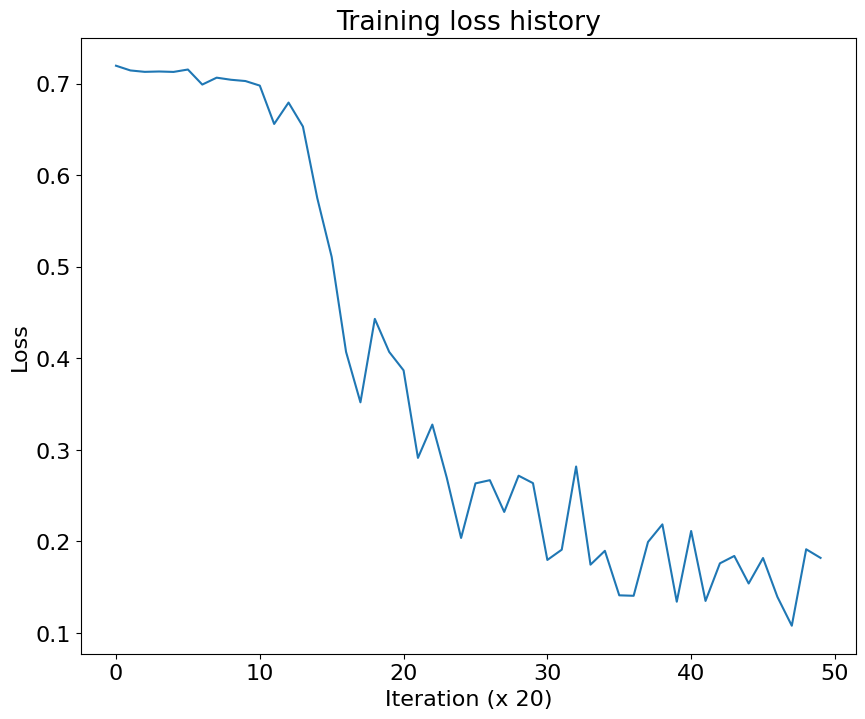

In [19]:

import torchvision
reset_seed(0)


# Take equally spaced examples from training dataset to make a subset.
small_dataset = torch.utils.data.Subset(
    train_dataset,
    torch.linspace(0, len(train_dataset) - 1, steps=BATCH_SIZE * 10).long()
)
small_train_loader = torch.utils.data.DataLoader(
    small_dataset, batch_size=BATCH_SIZE, pin_memory=True, num_workers=NUM_WORKERS
)


def infinite_loader(loader):
    """Get an infinite stream of batches from a data loader."""
    while True:
        yield from loader


def train_detector(
    detector,
    train_loader,
    learning_rate: float = 5e-3,
    weight_decay: float = 1e-4,
    max_iters: int = 5000,
    log_period: int = 20,
    device: str = "cpu",
):
    """
    Train the detector. We use SGD with momentum and step decay.
    """

    detector.to(device=device)

    # Optimizer: use SGD with momentum.
    # Use SGD with momentum
    optimizer = torch.optim.SGD(
        filter(lambda p: p.requires_grad, detector.parameters()),
        momentum=0.9,
        lr=learning_rate,
        weight_decay=weight_decay,
    )
    # LR scheduler: use step decay at 70% and 90% of training iters.
    lr_scheduler = torch.optim.lr_scheduler.MultiStepLR(
        optimizer, milestones=[int(0.6 * max_iters), int(0.9 * max_iters)]
    )

    # Keep track of training loss for plotting.
    loss_history = []

    train_loader = infinite_loader(train_loader)
    detector.train()

    for _iter in range(max_iters):
        # Ignore first arg (image path) during training.
        _, images, gt_boxes = next(train_loader)

        images = images.to(device)
        gt_boxes = gt_boxes.to(device)

        # Dictionary of loss scalars.
        losses = detector(images, gt_boxes)

        # Ignore keys like "proposals" in RPN.
        losses = {k: v for k, v in losses.items() if "loss" in k}

        optimizer.zero_grad()
        total_loss = sum(losses.values())
        total_loss.backward()
        optimizer.step()
        lr_scheduler.step()

        # Print losses periodically.
        if _iter % log_period == 0:
            loss_str = f"[Iter {_iter}][loss: {total_loss:.3f}]"
            for key, value in losses.items():
                loss_str += f"[{key}: {value:.3f}]"

            print(loss_str)
            loss_history.append(total_loss.item())

    # Plot training loss.
    plt.title("Training loss history")
    plt.xlabel(f"Iteration (x {log_period})")
    plt.ylabel("Loss")
    plt.plot(loss_history)
    plt.show()


# Create a wrapper module to contain backbone + RPN:
class FirstStage(nn.Module):
    def __init__(self, fpn_channels: int):
        super().__init__()
        self.backbone = DetectorBackboneWithFPN(out_channels=fpn_channels)
        self.rpn = RPN(
            fpn_channels=fpn_channels,
            # Simple stem of two layers:
            stem_channels=[fpn_channels, fpn_channels],
            batch_size_per_image=16,
            anchor_stride_scale=8,
            anchor_aspect_ratios=[0.5, 1.0, 2.0],
            anchor_iou_thresholds=(0.3, 0.6),
        )

    def forward(self, images, gt_boxes=None):
        feats_per_fpn_level = self.backbone(images)
        return self.rpn(feats_per_fpn_level, self.backbone.fpn_strides, gt_boxes)


first_stage = FirstStage(fpn_channels=64).to(DEVICE)

train_detector(
    first_stage,
    small_train_loader,
    learning_rate=8e-3,
    max_iters=1000,
    log_period=20,
    device=DEVICE,)

# Faster R-CNN

We have implemented the first half of Faster R-CNN, i.e., RPN, which is class-agnostic. Here, we briefly describe the second half Fast R-CNN.

Given a set of proposal boxes from RPN (per FPN level, per image),
we warp each region from the correspondng map to a fixed size 7x7 by using [RoI Align](https://arxiv.org/pdf/1703.06870.pdf).
We will use the `roi_align` function from `torchvision`. For usage instructions, see https://pytorch.org/docs/stable/torchvision/ops.html#torchvision.ops.roi_align

For simplicity and computational constraints of Google Colab,
our two-stage detector here differs from a standard Faster R-CNN system in the second stage:
In a full implementation, the second stage of the network would predict a box deltas to further refine RPN proposals.
We omit this for simplicity and keep RPN proposal boxes as final predictions.
Your model will definitely perform better if you add an extra box regression head in second stage.

### Your implementation exercise

Read `FasterRCNN` class documentation and code to understand how everything is pieced together.
By now you have already implemented the core components of a typical object detection system - you have dealt with anchor boxes or locations (FCOS), matched them with GT boxes, supervised model with your matching, and wrote inference utilities like NMS.
Great work!

### Classification Loss: cross entropy

The classification loss for second-stage is a cross entropy loss — you would have seen this in A3, and it is a multi-class extension of binary cross entropy loss used in RPN objectness classification. You may use `torch.nn.functional.cross_entropy` directly — follow instructions in Python script.

Beyond these, the second stage of Faster R-CNN doesn't add anything that is conceptually new — hence your implementation exercise is fairly lightweight.
We have implemented most of this module for you. We left out a few 3-4 line TODO blocks, only because if we wrote them, they would given away the solution for prior exercises (RPN and FCOS).
Moreover, empty code blocks will encourage you to carefully read the remaining portions for making everything work.
Feel free to refer/re-use your own implementation from the first part of the assignment for filling these blocks.

In [20]:
## This section requires code changes

class FasterRCNN(nn.Module):
    """
    Faster R-CNN detector: this module combines backbone, RPN, ROI predictors.

    Unlike Faster R-CNN, we will use class-agnostic box regression and Focal
    Loss for classification. We opted for this design choice for you to re-use
    a lot of concepts that you already implemented in FCOS - choosing one loss
    over other matters less overall.
    """

    def __init__(
        self,
        backbone: nn.Module,
        rpn: nn.Module,
        stem_channels: List[int],
        num_classes: int,
        batch_size_per_image: int,
        roi_size: Tuple[int, int] = (7, 7),
    ):
        super().__init__()
        self.backbone = backbone
        self.rpn = rpn
        self.num_classes = num_classes
        self.roi_size = roi_size
        self.batch_size_per_image = batch_size_per_image

        # Fill this list. It is okay to use your implementation from
        # `FCOSPredictionNetwork` for this code block.
        in_channels = stem_channels[0]
        cls_pred = []
        for i in range(len(stem_channels)):
          if i == 0:
            stem_layer = nn.Conv2d(in_channels, stem_channels[i], kernel_size=3, stride=1, padding=1, bias=True)
            nn.init.normal_(stem_layer.weight, mean=0, std=0.01)
            nn.init.zeros_(stem_layer.bias)
          else:
            stem_layer = nn.Conv2d(stem_channels[i-1], stem_channels[i], kernel_size=3, stride=1, padding=1, bias=True)
            nn.init.normal_(stem_layer.weight, mean=0, std=0.01)
            nn.init.zeros_(stem_layer.bias)

          cls_pred.append(nn.ReLU(inplace=True))
          cls_pred.append(stem_layer)
        cls_pred.append(nn.Flatten())
        flattened_size = in_channels * self.roi_size[0] * self.roi_size[1]
        cls_pred.append(nn.Linear(flattened_size, num_classes + 1))


        # Wrap the layers defined by student into a `nn.Sequential` module,
        # Faster R-CNN also predicts box offsets to "refine" RPN proposals, we
        # exclude it for simplicity and keep RPN proposal boxes as final boxes.
        self.cls_pred = nn.Sequential(*cls_pred)

    def forward(
        self,
        images: torch.Tensor,
        gt_boxes: Optional[torch.Tensor] = None,
        test_score_thresh: Optional[float] = None,
        test_nms_thresh: Optional[float] = None,
    ):
        """
        See documentation of `FCOS.forward` for more details.
        """

        feats_per_fpn_level = self.backbone(images)
        output_dict = self.rpn(
            feats_per_fpn_level, self.backbone.fpn_strides, gt_boxes
        )
        proposals_per_fpn_level = output_dict["proposals"]

        '''
        # Mix GT boxes with proposals. This is necessary to stabilize training
        # since RPN proposals may be bad during first few iterations. Also, why
        # waste good supervisory signal from GT boxes, for second-stage?
        if self.training:
            proposals_per_fpn_level = mix_gt_with_proposals(
                proposals_per_fpn_level, gt_boxes
            )
        '''
        # Get batch size from FPN feats:
        num_images = feats_per_fpn_level["p3"].shape[0]

        roi_feats_per_fpn_level = {
            level_name: None for level_name in feats_per_fpn_level.keys()
        }
        # Get RPN proposals from all levels.
        for level_name in feats_per_fpn_level.keys():

            level_feats = feats_per_fpn_level[level_name]
            level_props = output_dict["proposals"][level_name]
            level_stride = self.backbone.fpn_strides[level_name]


            # Print the shape of each tensor in level_props
            #for i, prop in enumerate(level_props):
                #print(f"level_props[{i}] shape:", prop.shape)

            # Concatenate tensors in level_props list along the first dimension
            level_props_tensor = torch.cat(level_props, dim=0)

            # Check the shape of level_props_tensor
            #print("level_props_tensor shape:", level_props_tensor.shape)

            # TODO 5: RoI Pooling
            ######################################################################
            #                            START YOUR CODE                         #
            ######################################################################
            # Call torchvision.ops.roi_pool with the concatenated tensor

            #roi_feats = torchvision.ops.roi_pool(level_props_tensor, level_feats, output_size=self.roi_size, spatial_scale=1.0/level_stride)
            roi_feats = torchvision.ops.roi_pool(level_feats, level_props_tensor, self.roi_size, level_stride)
            ######################################################################
            #                            END OF YOUR CODE                        #
            ######################################################################

            #num_elements_expected = roi_feats.numel() // num_images
            #print("Expected number of elements in roi_feats:", num_elements_expected)
            #print("Actual number of elements in roi_feats:", roi_feats.numel())


            roi_feats_per_fpn_level[level_name] = roi_feats

        # Combine ROI feats across FPN levels, do the same with proposals.
        # shape: (batch_size * total_proposals, fpn_channels, roi_h, roi_w)
        roi_feats = self._cat_across_fpn_levels(roi_feats_per_fpn_level, dim=0)

        # Obtain classification logits for all ROI features.
        # shape: (batch_size * total_proposals, num_classes)
        pred_cls_logits = self.cls_pred(roi_feats)

        if not self.training:
            # During inference, just go to this method and skip rest of the
            # forward pass. Batch size must be 1!
            # fmt: off
            return self.inference(
                images,
                proposals_per_fpn_level,
                pred_cls_logits,
                test_score_thresh=test_score_thresh,
                test_nms_thresh=test_nms_thresh,
            )
            # fmt: on

        ######################################################################
        # Match the RPN proposals with provided GT boxes and append to
        # `matched_gt_boxes`. Use `rcnn_match_anchors_to_gt` with IoU threshold
        # such that IoU > 0.5 is foreground, otherwise background.
        # There are no neutral proposals in second-stage.
        ######################################################################
        matched_gt_boxes = []

        # Iterate through each image in the batch
        for _idx in range(num_images):
            # Concatenate proposals from all FPN levels for the current image
            proposals_per_image = [
                output_dict["proposals"][level_name][_idx]
                for level_name in output_dict["proposals"]
            ]
            proposals_per_image = torch.cat(proposals_per_image, dim=0)

            # Get ground truth boxes for the current image
            gt_boxes_per_image = gt_boxes[_idx]

            # Call rcnn_match_anchors_to_gt to match proposals with GT boxes
            matched_gt_per_image = rcnn_match_anchors_to_gt(
                proposals_per_image[:, :4], gt_boxes_per_image, iou_thresholds=(0.5, 0.5)
            )

            # Append the matched GT boxes to the list
            matched_gt_boxes.append(matched_gt_per_image)

        # Combine matched GT boxes from all images in the batch by concatenating them
        matched_gt_boxes = torch.cat(matched_gt_boxes, dim=0)

        # Feel free to delete this line: (but keep variable names same)
        loss_cls = None
        # Replace "pass" statement with your code
        #print("matched_gt_boxes shape", matched_gt_boxes.shape)
        # Sample 25% foreground and 75% background RPN proposals
        num_foreground = int(0.25 * matched_gt_boxes.shape[0])
        num_background = matched_gt_boxes.shape[0] - num_foreground
        #print("Num foreground", num_foreground)
        #print("Num background", num_background)
        foreground_indices = torch.nonzero(matched_gt_boxes[:, -1] > 0).view(-1)
        background_indices = torch.nonzero(matched_gt_boxes[:, -1] <= 0).view(-1)
        #print("foreground indices shape", foreground_indices.shape)
        #print("background indices shape", background_indices.shape)

        # Check if there are enough foreground and background proposals available
        num_foreground = min(num_foreground, foreground_indices.numel())
        num_background = min(num_background, background_indices.numel())

        #print("Num foreground", num_foreground)
        #print("Num background", num_background)

        # If there are no positive or negative samples, set loss_cls to 0 and return
        if num_foreground == 0 or num_background == 0:
            loss_cls = torch.tensor(0.0, device=images.device)
        else:
            # Randomly sample foreground and background indices
            fg_indices = foreground_indices[torch.randperm(foreground_indices.numel())[:num_foreground]]
            bg_indices = background_indices[torch.randperm(background_indices.numel())[:num_background]]

            # Combine foreground and background indices
            sampled_indices = torch.cat([fg_indices, bg_indices], dim=0)

            # Get GT class labels and logits from the classifier
            gt_class_labels = matched_gt_boxes[sampled_indices, -1].long()
            pred_logits = pred_cls_logits[sampled_indices]

            # Shift GT class labels by +1 (background ID = 0)
            gt_class_labels_shifted = gt_class_labels + 1

            # Compute the cross-entropy loss
            loss_cls = F.cross_entropy(pred_logits, gt_class_labels_shifted)


        return {
            "loss_rpn_obj": output_dict["loss_rpn_obj"],
            "loss_rpn_box": output_dict["loss_rpn_box"],
            "loss_cls": loss_cls,
        }

    @staticmethod
    def _cat_across_fpn_levels(
        dict_with_fpn_levels: Dict[str, torch.Tensor], dim: int = 1
    ):
        """
        Convert a dict of tensors across FPN levels {"p3", "p4", "p5"} to a
        single tensor. Values could be anything - batches of image features,
        GT targets, etc.
        """
        return torch.cat(list(dict_with_fpn_levels.values()), dim=dim)

    def inference(
        self,
        images: torch.Tensor,
        proposals: torch.Tensor,
        pred_cls_logits: torch.Tensor,
        test_score_thresh: float,
        test_nms_thresh: float,
    ):
        """
        Run inference on a single input image (batch size = 1). Other input
        arguments are same as those computed in `forward` method. This method
        should not be called from anywhere except from inside `forward`.

        Returns:
            Three tensors:
                - pred_boxes: Tensor of shape `(N, 4)` giving *absolute* XYXY
                  co-ordinates of predicted boxes.

                - pred_classes: Tensor of shape `(N, )` giving predicted class
                  labels for these boxes (one of `num_classes` labels). Make
                  sure there are no background predictions (-1).

                - pred_scores: Tensor of shape `(N, )` giving confidence scores
                  for predictions.
        """

        # The second stage inference in Faster R-CNN is quite straightforward:
        # combine proposals from all FPN levels and perform a *class-specific
        # NMS*. There would have been more steps here if we further refined
        # RPN proposals by predicting box regression deltas.

        # Use `[0]` to remove the batch dimension.
        proposals = {level_name: prop[0] for level_name, prop in proposals.items()}
        pred_boxes = self._cat_across_fpn_levels(proposals, dim=0)

        ######################################################################
        # Faster R-CNN inference, perform the following steps in order:
        #   1. Get the most confident predicted class and score for every box.
        #      Note that the "score" of any class (including background) is its
        #      probability after applying C+1 softmax.
        #
        #   2. Only retain prediction that have a confidence score higher than
        #      provided threshold in arguments.
        #
        # NOTE: `pred_classes` may contain background as ID = 0 (based on how
        # the classifier was supervised in `forward`). Remember to shift the
        # predicted IDs such that model outputs ID (0-19) for 20 VOC classes.
        ######################################################################
        pred_scores, pred_classes = None, None
        # Replace "pass" statement with your code

        ######################################################################
        #                            START YOUR CODE                        #
        ######################################################################
        # Get the most confident predicted class and score for every box
        pred_probs = F.softmax(pred_cls_logits, dim=1)
        pred_scores, pred_classes = pred_probs.max(dim=1)

        # Retain predictions with confidence scores higher than the threshold
        valid_indices = pred_scores > test_score_thresh
        pred_boxes = pred_boxes[valid_indices]
        pred_classes = pred_classes[valid_indices] - 1  # Shift predicted IDs
        pred_scores = pred_scores[valid_indices]

        ##########################################################################
        #                             END OF YOUR CODE                           #
        ##########################################################################


        # STUDENTS: This line depends on your implementation of NMS.
        keep = class_spec_nms(
            pred_boxes, pred_scores, pred_classes, iou_threshold=test_nms_thresh
        )
        pred_boxes = pred_boxes[keep]
        pred_classes = pred_classes[keep]
        pred_scores = pred_scores[keep]
        return pred_boxes, pred_classes, pred_scores


## Overfit small data

After adding your implementation, overfit the model on a small dataset.

For dummy input images with shape: (2, 3, 224, 224)
Shape of c3 features: torch.Size([2, 64, 28, 28])
Shape of c4 features: torch.Size([2, 160, 14, 14])
Shape of c5 features: torch.Size([2, 400, 7, 7])
[Iter 0][loss: 3.765][loss_rpn_obj: 0.693][loss_rpn_box: 0.026][loss_cls: 3.046]
[Iter 10][loss: 3.263][loss_rpn_obj: 0.692][loss_rpn_box: 0.027][loss_cls: 2.544]
[Iter 20][loss: 0.961][loss_rpn_obj: 0.689][loss_rpn_box: 0.026][loss_cls: 0.246]
[Iter 30][loss: 1.167][loss_rpn_obj: 0.692][loss_rpn_box: 0.028][loss_cls: 0.447]
[Iter 40][loss: 1.141][loss_rpn_obj: 0.690][loss_rpn_box: 0.027][loss_cls: 0.425]
[Iter 50][loss: 1.040][loss_rpn_obj: 0.683][loss_rpn_box: 0.025][loss_cls: 0.332]
[Iter 60][loss: 0.952][loss_rpn_obj: 0.685][loss_rpn_box: 0.024][loss_cls: 0.243]
[Iter 70][loss: 0.954][loss_rpn_obj: 0.684][loss_rpn_box: 0.027][loss_cls: 0.243]
[Iter 80][loss: 0.945][loss_rpn_obj: 0.678][loss_rpn_box: 0.026][loss_cls: 0.241]
[Iter 90][loss: 0.947][loss_rpn_obj: 0.679][loss_rpn_box: 0.0

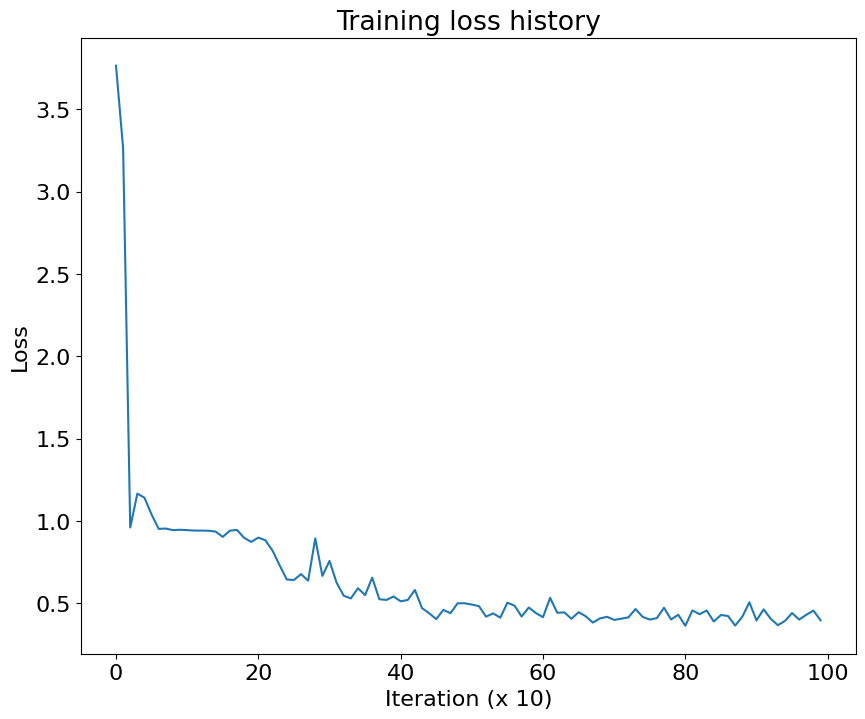

In [21]:

# Re-initialize dataset objects for independent debugging.
small_dataset = torch.utils.data.Subset(
    train_dataset,
    torch.linspace(0, len(train_dataset) - 1, steps=BATCH_SIZE * 10).long()
)
small_train_loader = torch.utils.data.DataLoader(
    small_dataset, batch_size=BATCH_SIZE, pin_memory=True, num_workers=NUM_WORKERS
)

FPN_CHANNELS = 64
backbone = DetectorBackboneWithFPN(out_channels=FPN_CHANNELS)
rpn = RPN(
    fpn_channels=FPN_CHANNELS,
    stem_channels=[FPN_CHANNELS, FPN_CHANNELS],
    batch_size_per_image=16,
    anchor_stride_scale=8,
    anchor_aspect_ratios=[0.5, 1.0, 2.0],
    anchor_iou_thresholds=(0.3, 0.6),
    pre_nms_topk=400,
    post_nms_topk=80,
)

# fmt: off
faster_rcnn = FasterRCNN(
    backbone, rpn, num_classes=20, roi_size=(7, 7),
    stem_channels=[FPN_CHANNELS, FPN_CHANNELS],
    batch_size_per_image=32,
)
# fmt: on

train_detector(
    faster_rcnn,
    small_train_loader,
    learning_rate=8e-3,
    max_iters=1000,
    log_period=10,
    device=DEVICE,
)

## Inference

Now, follow the instructions in `FasterRCNN.inference` to implement inference, similar to `FCOS.inference`.

Visualize the output from the trained model on a few images by executing the next cell, the bounding boxes should be somewhat accurate. They would get even better by using a bigger model and training it for longer.

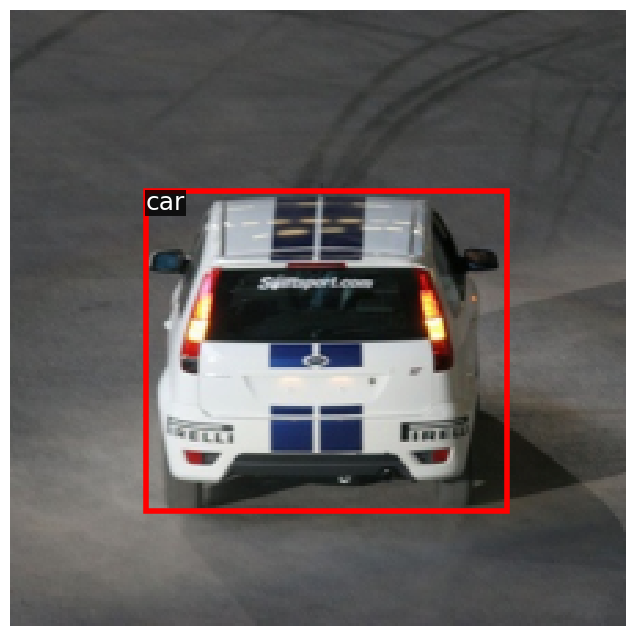

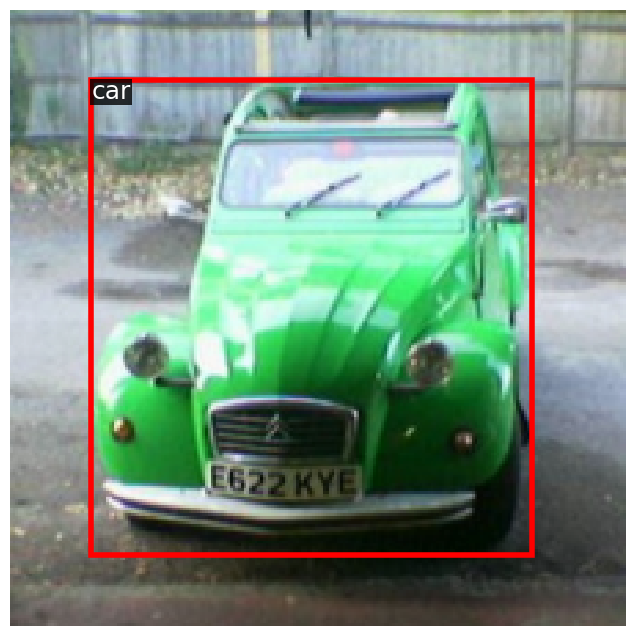

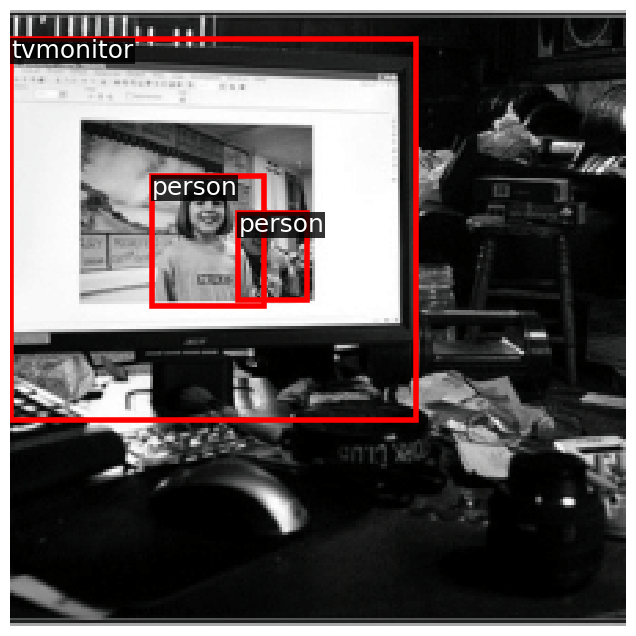

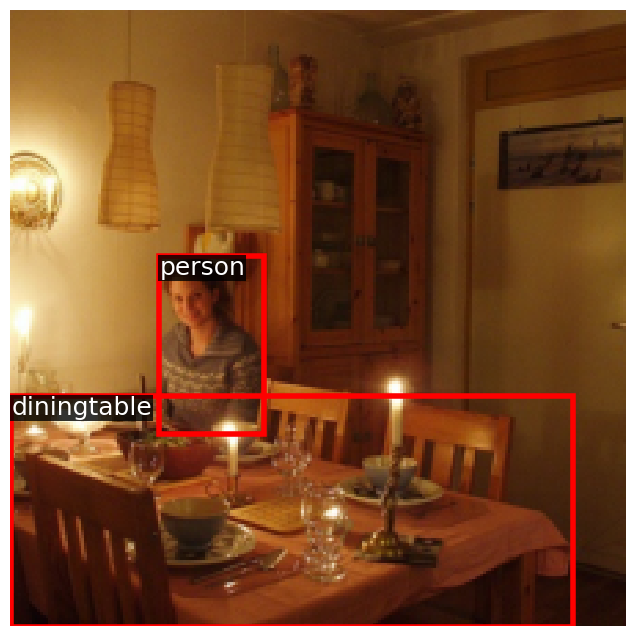

Total inference time: 13.0s


In [22]:

# Change the loader to have (batch size = 1) as required for inference.
small_train_loader = torch.utils.data.DataLoader(
    small_dataset, batch_size=1, pin_memory=True, num_workers=NUM_WORKERS
)

inference_with_detector(
    faster_rcnn,
    small_train_loader,
    val_dataset.idx_to_class,
    score_thresh=0.2,
    nms_thresh=0.5,
    device=DEVICE,
    dtype=torch.float32,
)

## Evaluation

Evaluate your Faster R-CNN like FCOS.
(**NOTE:** It is okay if your model does not perform very well.)

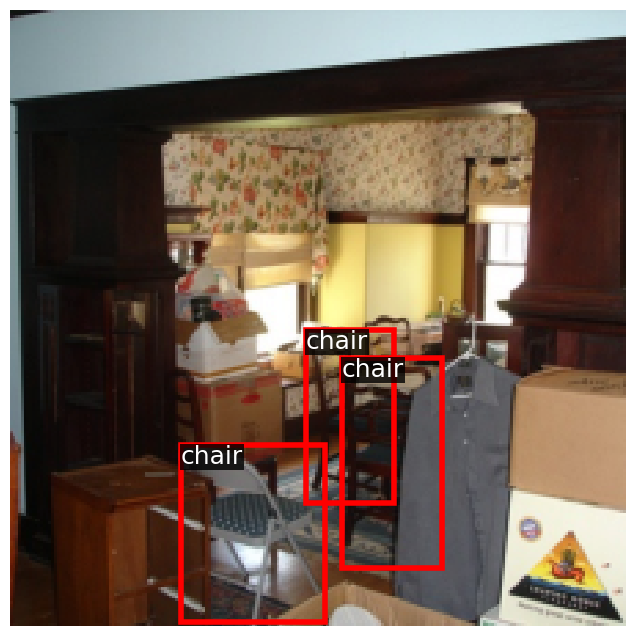

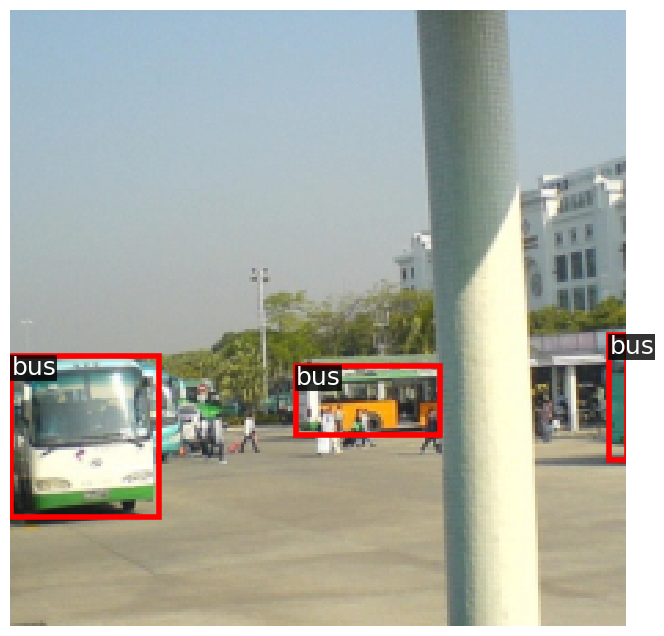

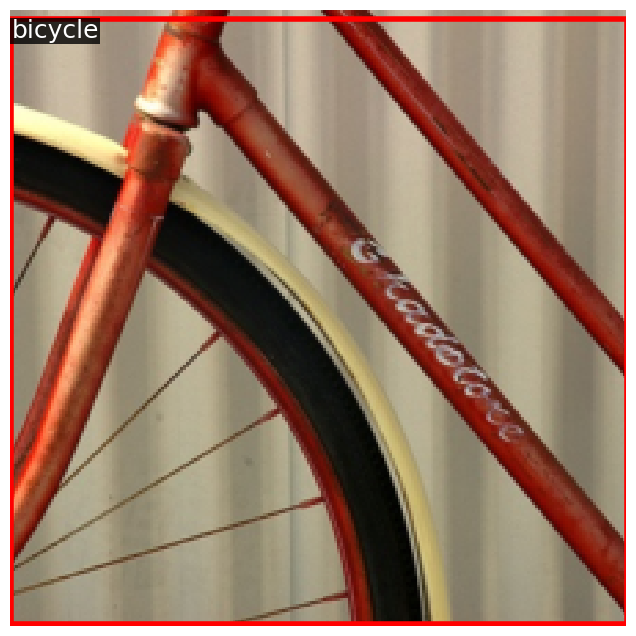

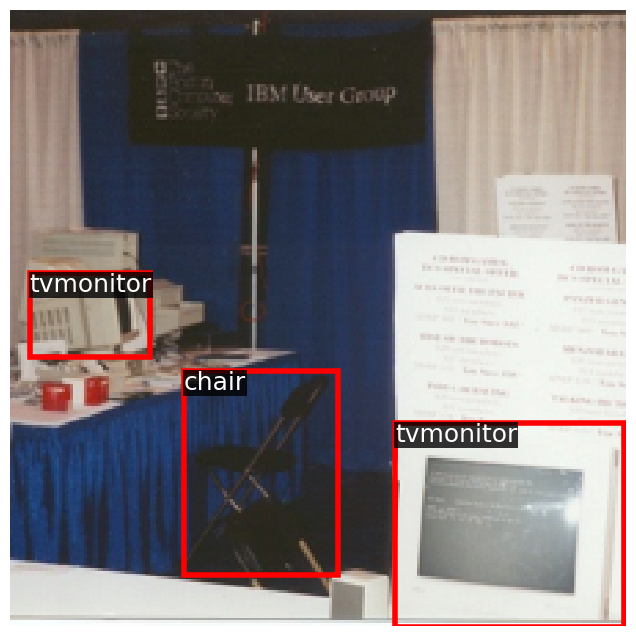

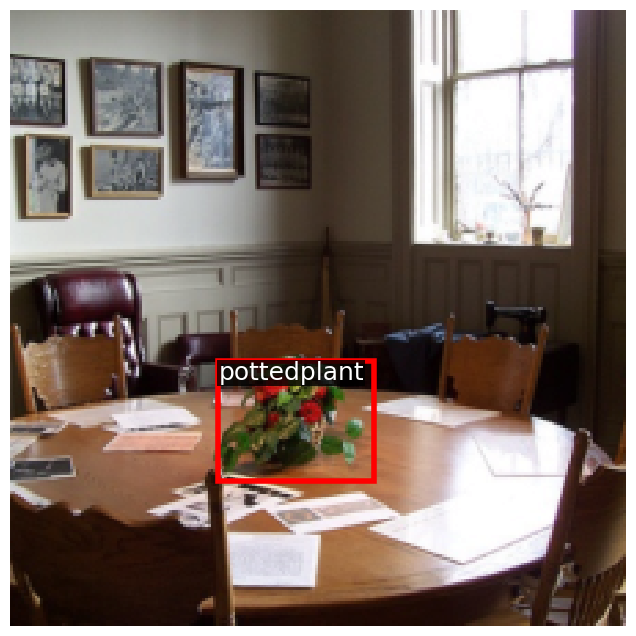

...

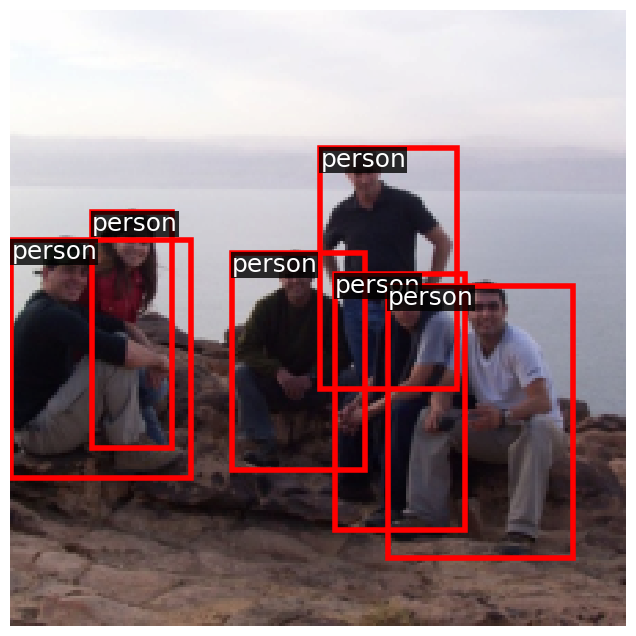

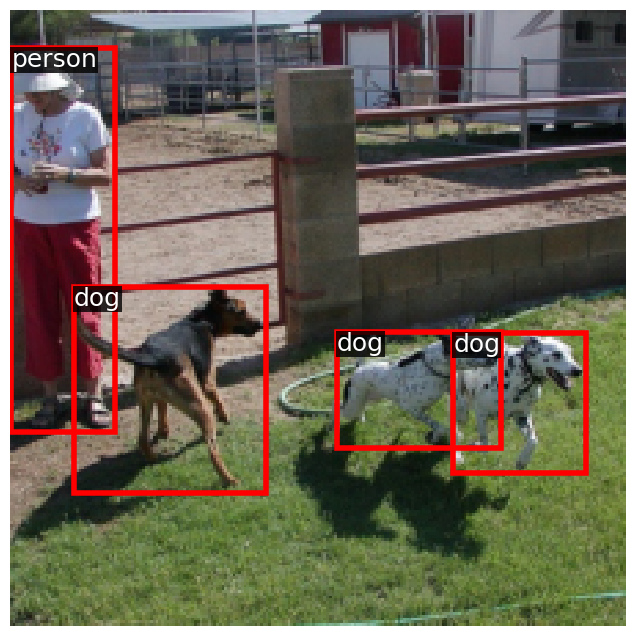

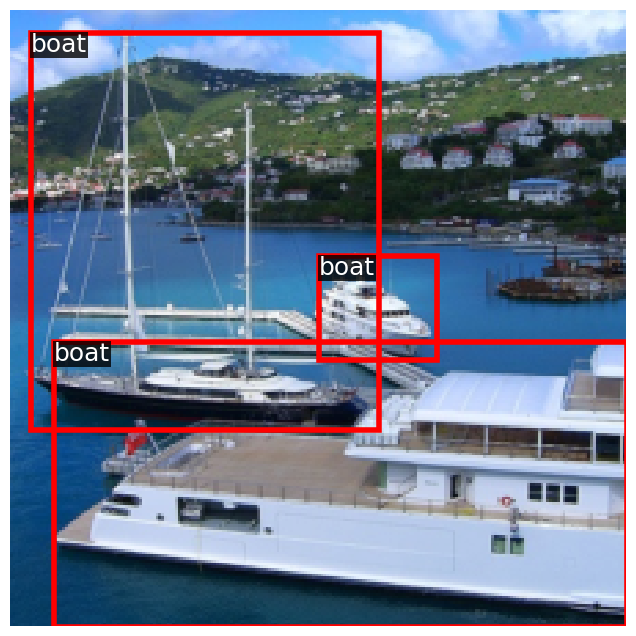

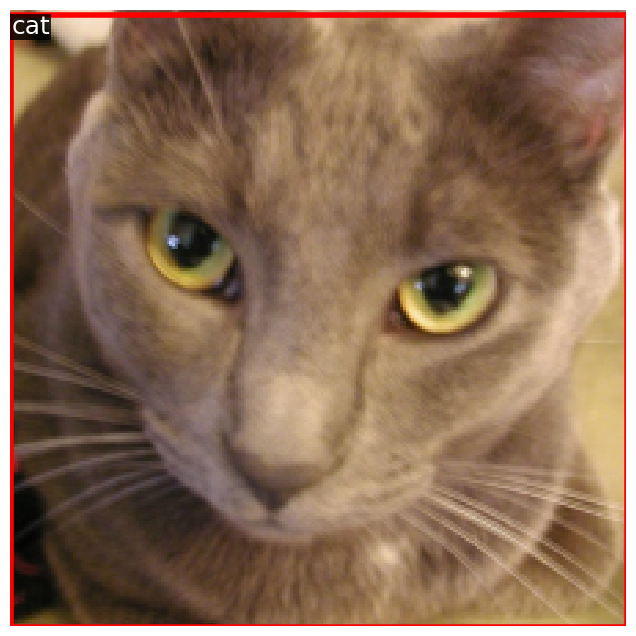

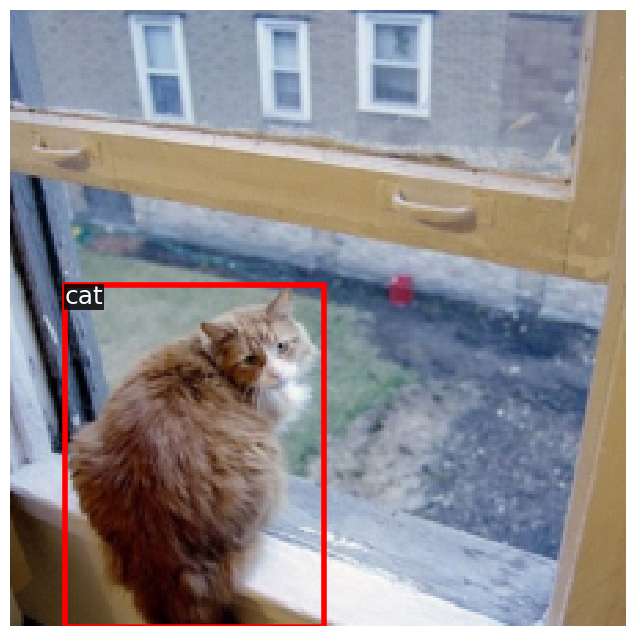

Total inference time: 192.2s


In [23]:
from PIL import Image
import shutil
inference_with_detector(
    faster_rcnn,
    val_loader,
    val_dataset.idx_to_class,
    score_thresh=0.2,
    nms_thresh=0.5,
    device=DEVICE,
    dtype=torch.float32,
)